<a href="https://colab.research.google.com/github/ariangh78/Image-Processing/blob/main/image_proccessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import numpy as np
import matplotlib.pyplot as plt
import os
import sys
import time
import math

In [ ]:
image_path = "/content/lena_gray_256.tif"
original_image = cv2.imread(image_path)

In [ ]:
original_image.shape

(256, 256, 3)

# **Image Processing Task: Zoom In on an Image**

**Objective:**

The goal of this image processing task is to zoom in on a given image by a specified zoom factor. The result is a new image with increased dimensions where each pixel from the original image is enlarged according to the zoom factor, effectively creating a magnified version of the original image.

**Description:**

Input Image: A color image represented as a 3D NumPy array with dimensions (height, width, 3), where the third dimension corresponds to the RGB color channels.

Zoom Factor: A scalar value that determines the degree of magnification. For instance, a zoom factor of 2 would double the dimensions of the original image, making it appear twice as large.

**Process:**

Calculate New Dimensions:

The dimensions of the zoomed image are computed by multiplying the original height and width by the zoom factor.

Initialize Zoomed Image:

 An empty NumPy array with the new dimensions is created to hold the zoomed image.

Populate Zoomed Image:

Each pixel in the original image is copied and placed in the corresponding positions of the zoomed image. For a zoom factor of 2, each pixel (i, j) in the original image is placed in positions (2*i, 2*j) in the zoomed image.

Output:

 The resulting image is a larger version of the input image, with dimensions scaled according to the zoom factor.

In [ ]:
def zoom_in(image, zoom_factor):
    height, width = image.shape[:2]
    new_height = int(height * zoom_factor)
    new_width = int(width * zoom_factor)
    zoomed_image = np.zeros((new_height, new_width, 3), dtype=np.uint8)
    for i in range(height):
        for j in range(width):
            original_i = int(i)
            original_j = int(j)
            zoomed_image[i*2, j*2] = image[original_i, original_j]
    return zoomed_image

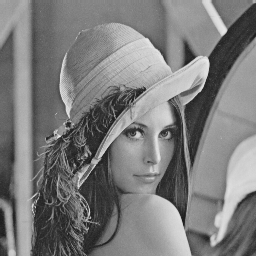

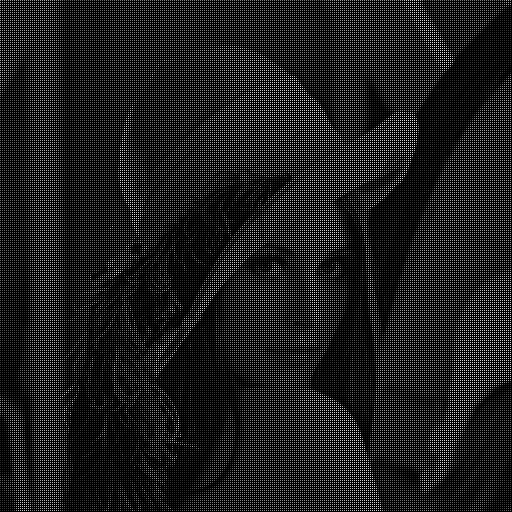

In [ ]:
zoom_factor = 2
zoomed_image = zoom_in(original_image, zoom_factor)
cv2_imshow(original_image)
cv2_imshow(zoomed_image)

# **Image Processing Task: Bilinear Interpolation Zoom In**

**Objective:**

The aim of this image processing task is to zoom in on a given image by a specified zoom factor using bilinear interpolation. This method provides a smoother and higher-quality magnified image compared to nearest-neighbor interpolation.

**Description:**

Input Image: A color image represented as a 3D NumPy array with dimensions (height, width, 3), where the third dimension corresponds to the RGB color channels.

Zoom Factor: A scalar value that determines the degree of magnification. For instance, a zoom factor of 2 would double the dimensions of the original image, making it appear twice as large.

**Process:**

Calculate New Dimensions: The dimensions of the zoomed image are computed by multiplying the original height and width by the zoom factor.
Initialize Zoomed Image: An empty NumPy array with the new dimensions is created to hold the zoomed image.
Bilinear Interpolation:
For each pixel in the zoomed image, calculate its corresponding coordinates in the original image by dividing by the zoom factor.
Identify the four surrounding pixels in the original image.
Compute the weighted average of these four pixels based on their distances from the calculated coordinates to obtain the value of the pixel in the zoomed image.

**Output:**

 The resulting image is a larger version of the input image, with dimensions scaled according to the zoom factor. Bilinear interpolation ensures that the zoomed image appears smoother and less pixelated.

In [ ]:
def bilinearinterpolation(image, zoom_factor):
    height, width = image.shape[:2]
    new_height = int(height * zoom_factor)
    new_width = int(width * zoom_factor)

    zoomed_image = np.zeros((new_height, new_width, 3), dtype=np.uint8)

    for i in range(new_height):
        for j in range(new_width):
            original_i = i / zoom_factor
            original_j = j / zoom_factor

            i1 = int(original_i)
            i2 = min(i1 + 1, height - 1)
            j1 = int(original_j)
            j2 = min(j1 + 1, width - 1)

            a = original_i - i1
            b = original_j - j1

            top_left = image[i1, j1]
            top_right = image[i1, j2]
            bottom_left = image[i2, j1]
            bottom_right = image[i2, j2]

            zoomed_image[i, j] = (
                (1 - a) * (1 - b) * top_left +
                a * (1 - b) * top_right +
                (1 - a) * b * bottom_left +
                a * b * bottom_right
            ).astype(np.uint8)

    return zoomed_image

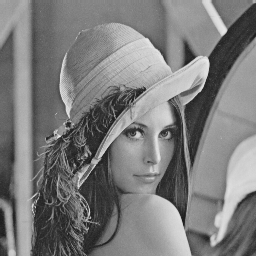

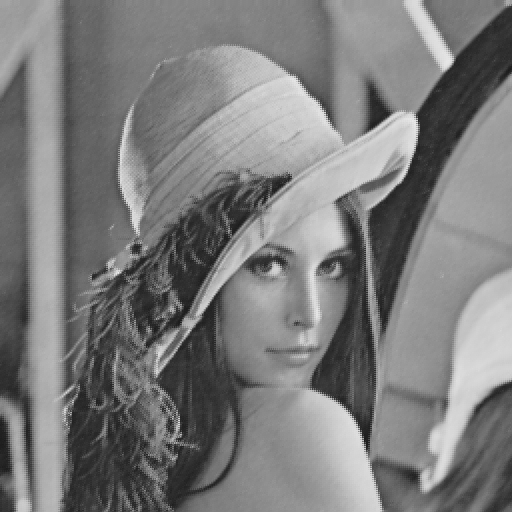

In [ ]:
original_image = cv2.imread(image_path)
zoom_factor = 2
zoomed_image = bilinearinterpolation(original_image, zoom_factor)
cv2_imshow(original_image)
cv2_imshow(zoomed_image)

# **Image Processing Task: Nearest-Neighbor Interpolation Zoom In**

**Objective:**

The goal of this image processing task is to zoom in on a given image by a specified zoom factor using nearest-neighbor interpolation. This method is simple and fast, providing an enlarged image with distinct pixel boundaries.

**Description:**

Input Image: A color image represented as a 3D NumPy array with dimensions (height, width, 3), where the third dimension corresponds to the RGB color channels.

**Zoom Factor:**

A scalar value that determines the degree of magnification. For example, a zoom factor of 2 doubles the dimensions of the original image, making it appear twice as large.

**Process:**

Calculate New Dimensions: The dimensions of the zoomed image are computed by multiplying the original height and width by the zoom factor.
Initialize Zoomed Image: An empty NumPy array with the new dimensions is created to hold the zoomed image.
Nearest-Neighbor Interpolation:
For each pixel in the zoomed image, find the corresponding pixel in the original image by dividing the zoomed coordinates by the zoom factor.
Assign the value of the nearest pixel from the original image to the current pixel in the zoomed image.

**Output:**

 The resulting image is a larger version of the input image, with dimensions scaled according to the zoom factor. Nearest-neighbor interpolation results in a pixelated effect, where each pixel from the original image is expanded into a block in the zoomed image.


In [ ]:
def nearest_neighbor_interpolation(image, zoom_factor):
    height, width = image.shape[:2]
    new_height = int(height * zoom_factor)
    new_width = int(width * zoom_factor)
    zoomed_image = np.zeros((new_height, new_width, 3), dtype=np.uint8)
    for i in range(new_height):
        for j in range(new_width):
            original_i = int(i / zoom_factor)
            original_j = int(j / zoom_factor)
            zoomed_image[i, j] = image[original_i, original_j]

    return zoomed_image

In [ ]:
print(original_image[5, 5])

[157 157 157]


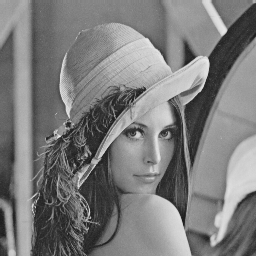

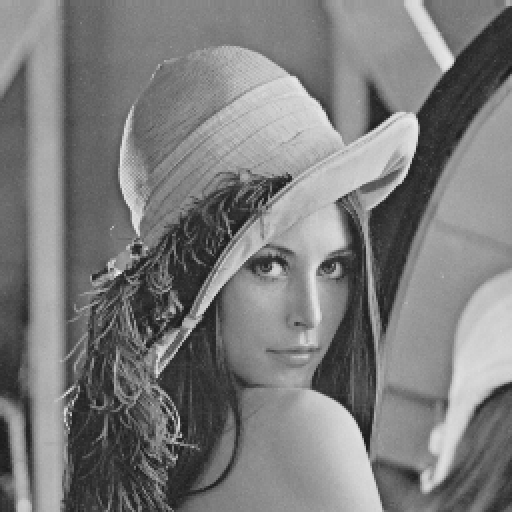

In [ ]:
original_image = cv2.imread(image_path)
zoom_factor = 2
zoomed_image = nearest_neighbor_interpolation(original_image, zoom_factor)
cv2_imshow(original_image)
cv2_imshow(zoomed_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

# **Image Processing Task: Bicubic Interpolation Zoom In**

**Objective:**

The goal of this image processing task is to zoom in on a given image by a specified zoom factor using bicubic interpolation. This method provides a smoother and higher-quality magnified image compared to both nearest-neighbor and bilinear interpolation.

**Description:**

Input Image: A color image represented as a 3D NumPy array with dimensions (height, width, 3), where the third dimension corresponds to the RGB color channels.

Zoom Factor: A scalar value that determines the degree of magnification. For instance, a zoom factor of 2 would double the dimensions of the original image, making it appear twice as large.

**Process:**

Calculate New Dimensions: The dimensions of the zoomed image are computed by multiplying the original height and width by the zoom factor.
Initialize Zoomed Image: An empty NumPy array with the new dimensions is created to hold the zoomed image.
Cubic Kernel Function: Define a cubic convolution kernel function that is used to calculate the weights for interpolation.
Bicubic Interpolation:
For each pixel in the zoomed image, calculate its corresponding coordinates in the original image by dividing by the zoom factor.
Identify the four surrounding pixels in the original image for each direction (x and y) and calculate their weights using the cubic kernel function.
Compute the weighted average of these pixels for each color channel to determine the pixel value in the zoomed image.

**Output:**

 The resulting image is a larger version of the input image, with dimensions scaled according to the zoom factor. Bicubic interpolation ensures that the zoomed image appears smooth and less pixelated.

In [ ]:

def bicubic_interpolation(img, zoom_factor):
    def cubic_kernel(t):
        """Cubic convolution kernel function."""
        a = -0.5
        t = abs(t)
        if t < 1:
            return (a + 2)*t**3 - (a + 3)*t**2 + 1
        elif t < 2:
            return a*t**3 - 5*a*t**2 + 8*a*t - 4*a
        return 0

    height, width = img.shape[:2]
    new_height, new_width = int(height * zoom_factor), int(width * zoom_factor)
    zoomed = np.zeros((new_height, new_width, img.shape[2]), dtype=np.uint8)

    for i in range(new_height):
        for j in range(new_width):
            x = i / zoom_factor
            y = j / zoom_factor

            x1, y1 = int(x), int(y)
            dx, dy = x - x1, y - y1
            x_vals = [min(max(x1 + i, 0), height - 1) for i in range(-1, 3)]
            y_vals = [min(max(y1 + j, 0), width - 1) for j in range(-1, 3)]
            for channel in range(img.shape[2]):
                value = 0
                for ii, xx in enumerate(x_vals):
                    for jj, yy in enumerate(y_vals):
                        kernel_x = cubic_kernel(ii - dx)
                        kernel_y = cubic_kernel(jj - dy)
                        value += img[xx, yy, channel] * kernel_x * kernel_y
                zoomed[i, j, channel] = min(max(value, 0), 255)

    return zoomed


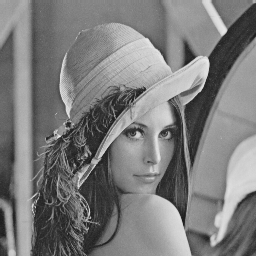

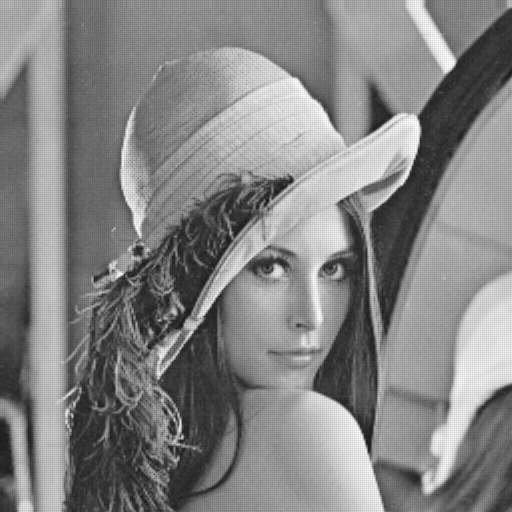

In [ ]:
zoomed_image = bicubic_interpolation(original_image, zoom_factor)
cv2_imshow(original_image)
cv2_imshow(zoomed_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

# **Image Processing Task: Rotate an Image**

**Objective:**

The goal of this image processing task is to rotate a given image by a specified angle using a basic rotation algorithm. The algorithm will reposition the pixels of the image to achieve the desired rotation effect.

**Description:**

Input Image: A color image represented as a 3D NumPy array with dimensions (height, width, 3), where the third dimension corresponds to the RGB color channels.

Angle: The angle in degrees by which the image should be rotated. Positive values indicate counterclockwise rotation, while negative values indicate clockwise rotation.

**Process:**

Convert Angle to Radians: The input angle in degrees is converted to radians for use in trigonometric functions.
Define Center and Dimensions: The center of the image and its dimensions are determined.
Rotation Matrix: A rotation matrix is defined using the angle in radians. This matrix is used to calculate the new positions of the pixels.
Initialize Rotated Image: An empty NumPy array with the same dimensions as the original image is created to hold the rotated image.
Rotate Each Pixel:
For each pixel in the original image, its new coordinates after rotation are calculated using the rotation matrix.
The new coordinates are rounded to the nearest integer values to match pixel positions.
If the new coordinates fall within the bounds of the image, the pixel value is assigned to the corresponding position in the rotated image.

**Output:**

 The resulting image is the original image rotated by the specified angle.

In [ ]:
import numpy as np

def rotate(image, angle_degrees):
    # Convert angle to radians
    angle_radians = np.radians(angle_degrees)

    # Define center and dimensions of the original image
    center = np.array(image.shape[:2]) / 2.0
    height, width = image.shape[:2]

    # Define the rotation matrix
    rotation_matrix = np.array([[np.cos(angle_radians), -np.sin(angle_radians)],
                                [np.sin(angle_radians), np.cos(angle_radians)]])

    # Initialize an empty array for the rotated image
    rotated_image = np.zeros_like(image)

    for i in range(height):
        for j in range(width):
            # Calculate new coordinates after rotation
            new_coords = np.dot(rotation_matrix, np.array([i - center[0], j - center[1]])) + center

            # Round to nearest integer coordinates
            new_i, new_j = np.round(new_coords).astype(int)

            # Check if the new coordinates are within the bounds
            if 0 <= new_i < height and 0 <= new_j < width:
                rotated_image[new_i, new_j] = image[i, j]

    return rotated_image

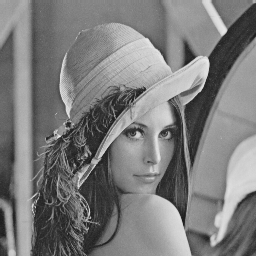

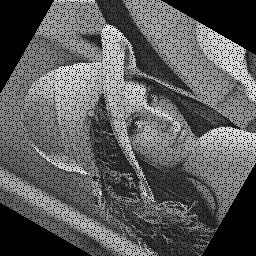

In [ ]:
rotate_image = rotate(original_image, 60)
cv2_imshow(original_image)
cv2_imshow(rotate_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

# **Image Processing Task: Rotate an Image Using Nearest-Neighbor Interpolation**

**Objective:**

The goal of this image processing task is to rotate a given image by a specified angle using the nearest-neighbor interpolation method. This method repositions the pixels of the image to achieve the desired rotation effect while maintaining a relatively simple and fast implementation.

**Description:**

Input Image: A color image represented as a 3D NumPy array with dimensions (height, width, 3), where the third dimension corresponds to the RGB color channels.

Angle: The angle in degrees by which the image should be rotated. Positive values indicate counterclockwise rotation, while negative values indicate clockwise rotation.

**Process:**

Convert Angle to Radians: The input angle in degrees is converted to radians for use in trigonometric functions.
Define Center and Dimensions: The center of the image and its dimensions are determined.
Rotation Matrix: A 3x3 rotation matrix is defined using the angle in radians. This matrix includes translation components to rotate around the image center.
Initialize Rotated Image: An empty NumPy array with the same dimensions as the original image is created to hold the rotated image.
Rotate Each Pixel:
For each pixel in the original image, calculate its new coordinates after rotation using the rotation matrix.
The new coordinates are rounded to the nearest integer values to match pixel positions.
If the new coordinates fall within the bounds of the image, the pixel value from the original image is assigned to the corresponding position in the rotated image.

**Output:**

 The resulting image is the original image rotated by the specified angle.

In [ ]:
def rotate_nearest_neighbor(image, angle_degrees):
    angle_radians = np.radians(angle_degrees)
    center = np.array(image.shape[:2]) / 2.0
    height, width = image.shape[:2]
    rotation_matrix = np.array([[np.cos(angle_radians), -np.sin(angle_radians), 0],
                                [np.sin(angle_radians), np.cos(angle_radians), 0],
                                [0, 0, 1]])
    rotated_image = np.zeros_like(image)
    for i in range(height):
        for j in range(width):
            coords = np.dot(rotation_matrix, np.array([i - center[0], j - center[1], 1]))
            new_i, new_j = np.round(coords[:2] + center).astype(int)
            if 0 <= new_i < height and 0 <= new_j < width:
                rotated_image[i, j] = image[new_i, new_j]

    return rotated_image

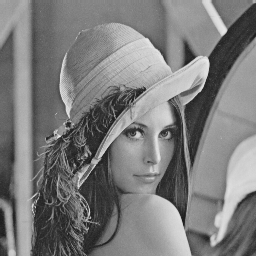

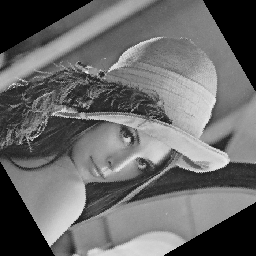

In [ ]:
rotate_image = rotate_nearest_neighbor(original_image, 60)
cv2_imshow(original_image)
cv2_imshow(rotate_image)

In [ ]:
import numpy as np

def rotate_nearest_neighbor2(image, angle_degrees):
    angle_radians = np.radians(angle_degrees)

    # Original dimensions
    height, width, channels = image.shape

    # New dimensions
    diagonal = int(np.ceil(np.sqrt(height**2 + width**2)))
    new_height, new_width = diagonal, diagonal

    # New center
    center = np.array([new_height, new_width]) / 2.0

    rotation_matrix = np.array([
        [np.cos(angle_radians), -np.sin(angle_radians), 0],
        [np.sin(angle_radians), np.cos(angle_radians), 0],
        [0, 0, 1]
    ])

    # Create a zero-padded rotated image
    rotated_image = np.zeros((new_height, new_width, channels), dtype=image.dtype)

    for i in range(new_height):
        for j in range(new_width):
            coords = np.dot(rotation_matrix, np.array([i - center[0], j - center[1], 1]))
            new_i, new_j = np.round(coords[:2] + center).astype(int)
            if 0 <= new_i < height and 0 <= new_j < width:
                rotated_image[i, j, :] = image[new_i, new_j, :]

    return rotated_image

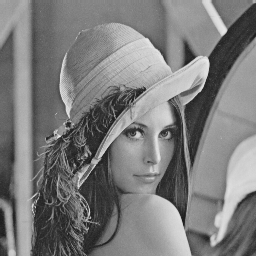

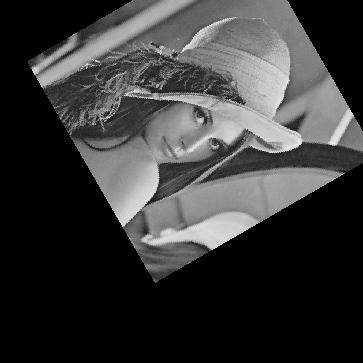

In [ ]:
rotate_image = rotate_nearest_neighbor2(original_image, 60)
cv2_imshow(original_image)
cv2_imshow(rotate_image)

# **Image Processing Task: Rotate an Image Using Bilinear Interpolation**

**Objective:**

The goal of this image processing task is to rotate a given image by a specified angle using bilinear interpolation. This method repositions the pixels of the image to achieve the desired rotation effect while providing a smoother and higher-quality result compared to nearest-neighbor interpolation.

**Description:**

Input Image: A color image represented as a 3D NumPy array with dimensions (height, width, 3), where the third dimension corresponds to the RGB color channels.

Angle: The angle in degrees by which the image should be rotated. Positive values indicate counterclockwise rotation, while negative values indicate clockwise rotation.

**Process:**

Convert Angle to Radians: The input angle in degrees is converted to radians for use in trigonometric functions.
Define Center and Dimensions: The center of the image and its dimensions are determined.
Rotation Matrix: A 2x2 rotation matrix is defined using the angle in radians. This matrix is used to calculate the new positions of the pixels.
Initialize Rotated Image: An empty NumPy array with the same dimensions as the original image is created to hold the rotated image.
Rotate Each Pixel:
For each pixel in the original image, calculate its new coordinates after rotation using the rotation matrix.
Extract the fractional and integer parts of the new coordinates.
Ensure the integer parts are within the bounds of the image.
Perform bilinear interpolation using the four surrounding pixels in the original image to compute the new pixel value.

**Output:**

 The resulting image is the original image rotated by the specified angle, with smoother transitions between pixel values due to bilinear interpolation.

In [ ]:
def rotate_bilinear_interpolation(image, angle_degrees):
    # Convert angle to radians
    angle_radians = np.radians(angle_degrees)

    # Define center and dimensions of the original image
    center = np.array(image.shape[:2]) / 2.0
    height, width = image.shape[:2]

    # Define the rotation matrix
    rotation_matrix = np.array([[np.cos(angle_radians), -np.sin(angle_radians)],
                                [np.sin(angle_radians), np.cos(angle_radians)]])

    # Initialize an empty array for the rotated image
    rotated_image = np.zeros_like(image)

    for i in range(height):
        for j in range(width):
            # Calculate new coordinates after rotation
            new_coords = np.dot(rotation_matrix, np.array([i - center[0], j - center[1]])) + center

            # Extract fractional and integer parts
            y, x = new_coords
            y_frac, y_int = np.modf(y)
            x_frac, x_int = np.modf(x)

            # Ensure the integer parts are within bounds
            y_int = np.clip(y_int, 0, height-2).astype(int)
            x_int = np.clip(x_int, 0, width-2).astype(int)

            # Bilinear interpolation
            top_left = image[y_int, x_int] * (1 - y_frac) * (1 - x_frac)
            top_right = image[y_int, x_int+1] * (1 - y_frac) * x_frac
            bottom_left = image[y_int+1, x_int] * y_frac * (1 - x_frac)
            bottom_right = image[y_int+1, x_int+1] * y_frac * x_frac

            rotated_image[i, j] = top_left + top_right + bottom_left + bottom_right

    return rotated_image

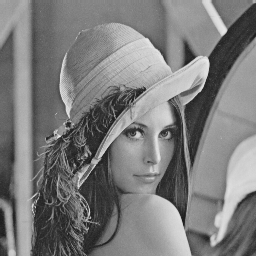

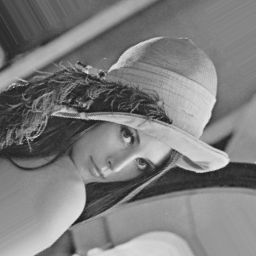

In [ ]:
rotate_image = rotate_bilinear_interpolation(original_image, 60)
cv2_imshow(original_image)
cv2_imshow(rotate_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

# **Image Processing Task: Enhance Image Contrast and Plot Histogram**

**Objective:**

The goal of this image processing task is to enhance the contrast of a given image and visualize the distribution of pixel intensities before and after contrast enhancement using histograms.

**Steps:**

Load Image: Load the image using the PIL library.

Enhance Contrast: Use the ImageEnhance.Contrast method from PIL to enhance the contrast of the image.

Display Enhanced Image: Display the contrast-enhanced image to visualize the changes.

Plot Histogram: Plot the histogram of pixel intensities for both the original and the contrast-enhanced images to compare the distribution of pixel values.

In [ ]:
import numpy as np
from scipy.optimize import minimize

In [ ]:
from PIL import Image, ImageEnhance
from IPython.display import display

# After enhancing the contrast or any other image processing:
original_image = Image.open(image_path)

enhancer = ImageEnhance.Contrast(original_image)
contrast_image = enhancer.enhance(1.5)  # 2 means double the contrast. Adjust as needed.

contrast_image.show()

In [ ]:

image_path_color = "/content/lena_color_256.tif"
ColorImage = Image.open(image_path_color)



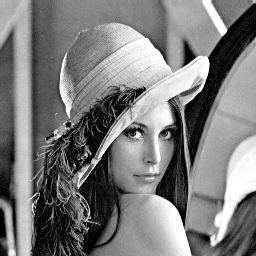

In [ ]:
display(contrast_image)


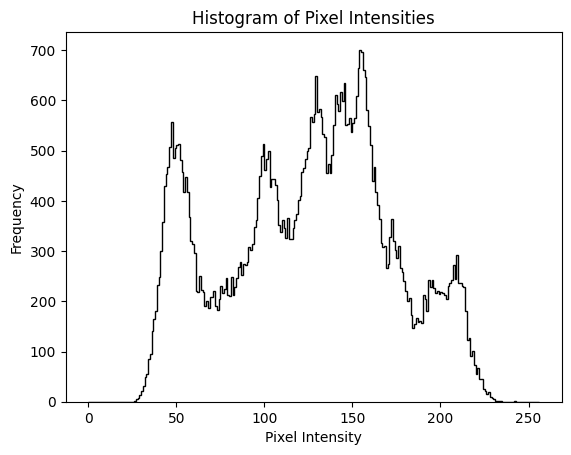

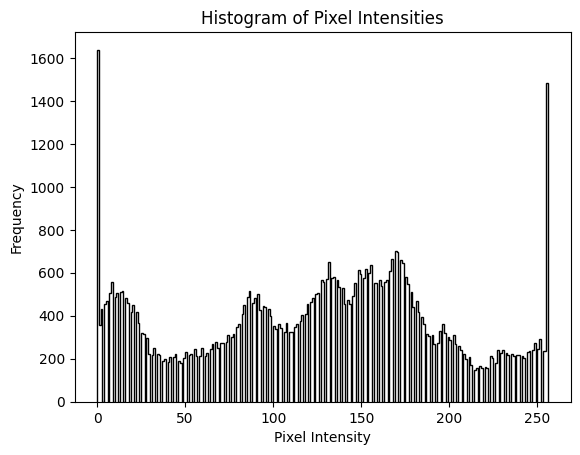

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_histogram(img):
    img_array = np.asarray(img.convert('L'))  # Convert image to grayscale
    plt.hist(img_array.ravel(), bins=256, range=(0,256), histtype='step', color='black')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.title('Histogram of Pixel Intensities')
    plt.show()

# Display histogram for the original image
plot_histogram(original_image)

# Display histogram for the contrast-enhanced image
plot_histogram(contrast_image)



# **Image Processing Task: Histogram Equalization**

**Objective:**

The goal of this image processing task is to perform histogram equalization on a grayscale image to enhance its contrast. Histogram equalization spreads out the most frequent intensity values, improving the contrast of the image.

**Description:**

Histogram equalization adjusts the pixel values of an image such that the histogram of the output image is approximately uniform. This can be particularly useful for enhancing the contrast of images where the pixel values are concentrated in a narrow range.

**Steps:**

Convert Image to Grayscale: Convert the image to grayscale to simplify processing.

Compute Histogram: Compute the histogram of pixel intensities.

Compute Cumulative Distribution Function (CDF): Calculate the CDF from the histogram.

Normalize CDF: Normalize the CDF to map pixel values to the full range [0, 255].

Equalize Image: Use the normalized CDF to adjust pixel values.

Return Equalized Image: Convert the resulting array back to an image format.

In [ ]:
def histogram_equalization(img):
    img_array = np.asarray(img.convert('L'))  # Convert image to grayscale
    histogram, bin_edges = np.histogram(img_array.flatten(), bins=256, range=(0,256))

    cdf = histogram.cumsum()  # Cumulative distribution function
    cdf_normalized = cdf * float(histogram.max()) / cdf.max()

    # Equalize
    cdf_m = np.ma.masked_equal(cdf,0)
    cdf_m = (cdf_m - cdf_m.min()) * 255 / (cdf_m.max()-cdf_m.min())
    cdf = np.ma.filled(cdf_m,0).astype('uint8')

    img_equalized = cdf[img_array]
    return Image.fromarray(img_equalized)

In [ ]:
def intensity(img):
  img_array = np.asarray(img.convert('L'))
  flatten_image = img_array.flatten()
  M = np.zeros(256, dtype=np.uint8)
  counts = {}
  for elem in flatten_image:
      if elem in counts:
          counts[elem] += 1
      else:
          counts[elem] = 1
  normalize_histogram = {key: value / flatten_image.shape[0] for key, value in counts.items()}
  return counts , normalize_histogram

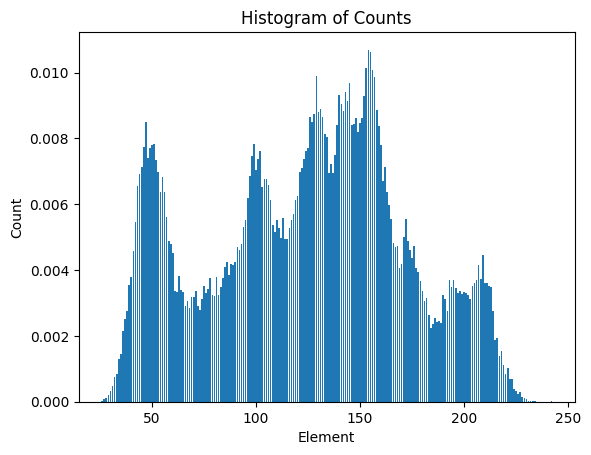

In [ ]:
c,n = intensity(original_image)
plt.bar(n.keys(), n.values())
plt.xlabel('Element')
plt.ylabel('Count')
plt.title('Histogram of Counts')
plt.show()

In [ ]:
def histogram_equalization(img):
  counts, normalize_histogram = intensity(img)
  S = {}
  cumsum = 0
  for key in sorted(normalize_histogram.keys()):
       cumsum += normalize_histogram[key]
       S[key] = cumsum
    # Apply histogram equalization
  img_array = np.asarray(img.convert('L'))
  equalized_image = np.zeros_like(img_array)
  for i in range(img_array.shape[0]):
      for j in range(img_array.shape[1]):
          pixel_value = img_array[i, j]
          equalized_image[i, j] = int(S[pixel_value] * 255)

  return Image.fromarray(equalized_image)

In [ ]:
def histogram_matching_manual(img, target_img):
    counts, normalize_histogram = intensity(img)
    target_counts, target_normalize_histogram = intensity(target_img)
    S = {}
    cumsum = 0
    for key in sorted(normalize_histogram.keys()):
        cumsum += normalize_histogram[key]
        S[key] = cumsum

    Z = {}
    cumsum2 = 0
    for key in sorted(target_normalize_histogram.keys()):
        cumsum2 += target_normalize_histogram[key]
        Z[key] = cumsum2

    img_array = np.asarray(img.convert('L'))
    matched_image = np.zeros_like(img_array)

    for i in range(img_array.shape[0]):
        for j in range(img_array.shape[1]):
            pixel_value = img_array[i, j]
            # the min function will return the key x for which abs(Z[x] - S[pixel_value]) is minimized.
            closest_value = min(Z.keys(), key=lambda x: abs(Z[x] - S[pixel_value]))
            # Assign the closest pixel value to the matched image
            matched_image[i, j] = closest_value
    return Image.fromarray(matched_image)

In [ ]:
histogram_eq = histogram_equalization(original_image)

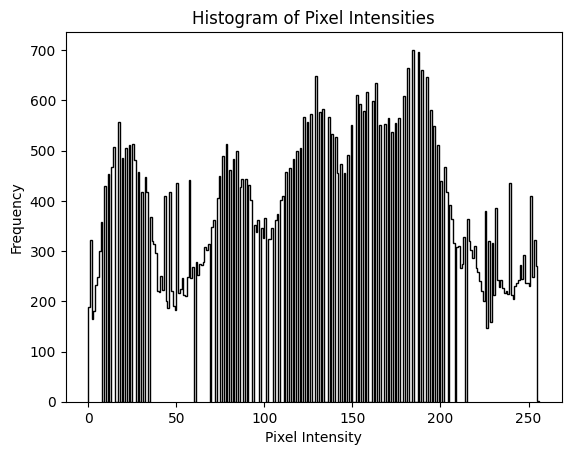

In [ ]:
equalized_image = histogram_equalization(original_image)
plot_histogram(equalized_image)


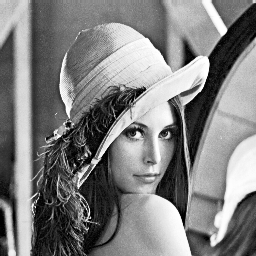

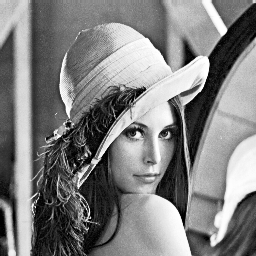

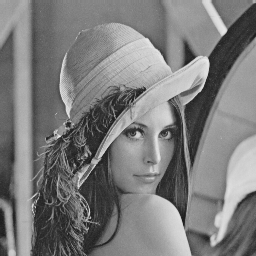

In [ ]:
display(equalized_image)
display(histogram_eq)
display(original_image)


# **Image Processing Task: Histogram Matching**

**Objective:**

The objective of this task is to perform histogram matching (or histogram specification) to make the histogram of the source image match the histogram of the reference image. This technique is used to adjust the pixel intensity distribution of an image to resemble another image.

**Description:**

Histogram matching involves transforming the pixel values of the source image so that its histogram matches the histogram of the reference image. This is done by mapping pixel values from the source image to the reference image using their cumulative distribution functions (CDFs).

**Steps:**

Convert Images to Grayscale: Convert both the source and reference images to grayscale to simplify the histogram matching process.

Compute CDFs: Calculate the cumulative distribution functions (CDFs) for both the source and reference images.

Create Mapping: Create a mapping from the source image's pixel values to the reference image's pixel values based on the CDFs.

Apply Mapping: Use the mapping to transform the pixel values in the source image.

Return the Matched Image: Convert the transformed array back to an image format.

In [ ]:
def compute_cdf(img):
    """Compute the CDF for an image."""
    histogram, _ = np.histogram(img.flatten(), bins=256, range=(0, 256))
    cdf = histogram.cumsum()
    cdf_normalized = cdf / float(cdf.max())
    return cdf_normalized

In [ ]:
def histogram_matching(source_img, reference_img):
    # Convert both images to grayscale
    source_img_array = np.asarray(source_img.convert('L'))
    reference_img_array = np.asarray(reference_img.convert('L'))

    # Compute CDFs
    src_cdf = compute_cdf(source_img_array)
    ref_cdf = compute_cdf(reference_img_array)

    # Create an empty mapping
    M = np.zeros(256, dtype=np.uint8)

    # Populate the mapping to match source's CDF to reference's CDF
    for i in range(256):
        diff = abs(src_cdf[i] - ref_cdf)
        idx = np.argmin(diff)
        M[i] = idx

    # Apply the mapping
    matched_img_array = M[source_img_array]

    return Image.fromarray(matched_img_array)




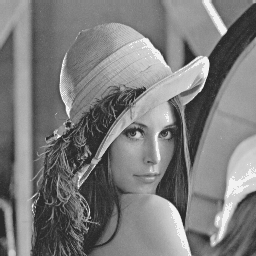

In [ ]:
matched_image_mannual = histogram_matching_manual(contrast_image,original_image)
display(matched_image_mannual)


In [ ]:
matched_image = histogram_matching(contrast_image,original_image)
matched_image.show()

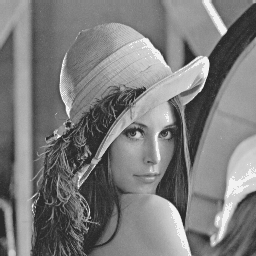

In [ ]:
display(matched_image)


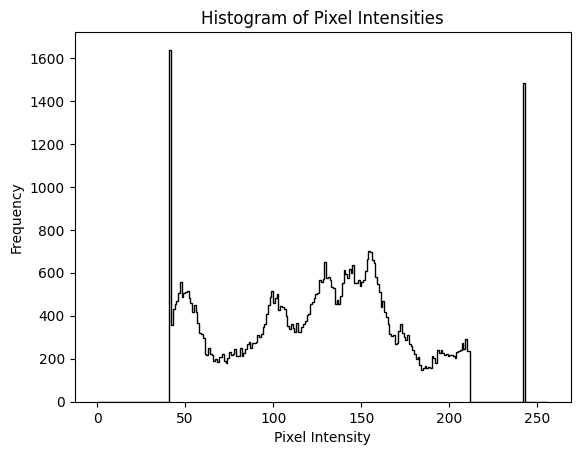

In [ ]:
plot_histogram(matched_image)


# **Image Processing Task: Edge Detection and Image Sharpening**

**Objective:**

The goal of this task is to apply edge detection using the Sobel operator and then use the detected edges to enhance the sharpness of an image. This is achieved by computing the gradient magnitude of the image and combining it with the original image to create a sharpened version.

**Steps:**

Compute Gradient Magnitude: Use the Sobel operator to compute the gradient in both x and y directions. Calculate the gradient magnitude to capture the edges.

Combine with Original Image: Use the gradient magnitude to enhance the sharpness of the original image.

Display Results: Show the original image, gradient magnitude, and sharpened image side by side for comparison.


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread('/content/1.2.12.tiff', cv2.IMREAD_GRAYSCALE)


In [ ]:
sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)

In [ ]:
gradient_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
gradient_magnitude = np.uint8(gradient_magnitude)


In [ ]:
alpha = 1.5
sharpened = cv2.addWeighted(image, 1 + alpha, gradient_magnitude, -alpha, 0)

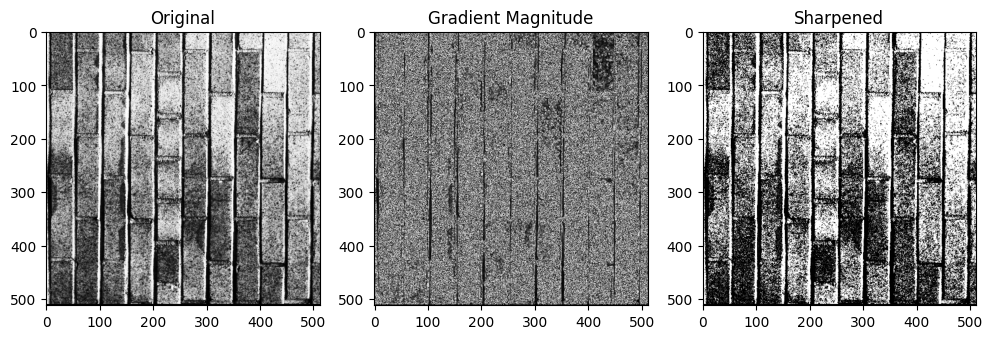

In [ ]:
plt.figure(figsize=(12, 6))
plt.subplot(131), plt.imshow(image, cmap='gray'), plt.title('Original')
plt.subplot(132), plt.imshow(gradient_magnitude, cmap='gray'), plt.title('Gradient Magnitude')
plt.subplot(133), plt.imshow(sharpened, cmap='gray'), plt.title('Sharpened')
plt.show()

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

image = Image.open('/content/1.2.12.tiff').convert('L')
image = np.array(image)

In [ ]:
sobel_x_kernel = np.array([[-1, 0, 1],
                           [-2, 0, 2],
                           [-1, 0, 1]])

sobel_y_kernel = np.array([[-1, -2, -1],
                           [0, 0, 0],
                           [1, 2, 1]])


In [ ]:
def convolve(image, kernel):
    padded_image = np.pad(image, pad_width=1, mode='constant')
    output = np.zeros_like(padded_image)

    for y in range(image.shape[1]):
        for x in range(image.shape[0]):
            output[x+1, y+1] = (kernel * padded_image[x:x+3, y:y+3]).sum()
    return output


In [ ]:
def convolve2(image, kernel):
    # Get the dimensions of the image and the kernel
    image_height, image_width = image.shape
    kernel_height, kernel_width = kernel.shape

    # Create an empty output array
    output = np.zeros_like(image)

    # Pad the image with zeros around the border
    pad_height = kernel_height // 2
    pad_width = kernel_width // 2
    padded_image = np.pad(image, ((pad_height, pad_height), (pad_width, pad_width)), mode='constant')

    # Perform the convolution
    for y in range(pad_height, image_height + pad_height):
        for x in range(pad_width, image_width + pad_width):
            # Ensure the kernel is centered over each pixel
            window = padded_image[y-pad_height:y+pad_height+1, x-pad_width:x+pad_width+1]
            output[y-pad_height, x-pad_width] = np.sum(kernel * window)

    # Making sure the output values are in the 0-255 range
    output = np.clip(output, 0, 255)

    return output

In [ ]:
sobel_x = convolve2(image, sobel_x_kernel)
sobel_y = convolve2(image, sobel_y_kernel)

In [ ]:
gradient_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
gradient_magnitude = (gradient_magnitude / np.max(gradient_magnitude) * 255).astype(np.uint8)


In [ ]:
alpha = 1.5
sharpened = np.clip(image + alpha * gradient_magnitude, 0, 255)

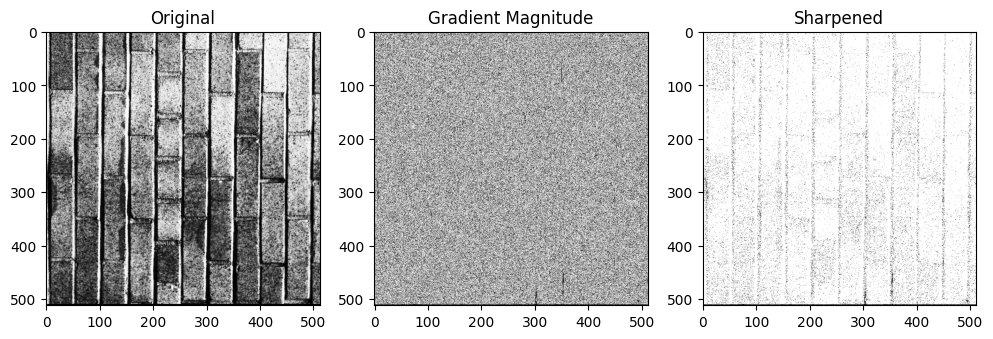

In [ ]:
plt.figure(figsize=(12, 6))
plt.subplot(131), plt.imshow(image, cmap='gray'), plt.title('Original')
plt.subplot(132), plt.imshow(gradient_magnitude, cmap='gray'), plt.title('Gradient Magnitude')
plt.subplot(133), plt.imshow(sharpened, cmap='gray'), plt.title('Sharpened')
plt.show()

# **Image Processing Task: Laplacian Filtering and Sharpening**

**Objective:**

The goal of this task is to apply Laplacian filters to an image to enhance its edges and then use these filtered images to create sharpened versions of the original image. The Laplacian filters are used to detect edges and enhance the sharpness of the image.

**Description:**

Laplacian filters are used to detect areas of rapid intensity change in images, which are often edges. By applying these filters and adding (or subtracting) the result to the original image, you can enhance the edges and make the image appear sharper.

**Steps:**

Define Laplacian Kernels: Specify different Laplacian kernels for edge detection.

Apply Convolution: Use the Laplacian kernels to convolve the image and obtain edge maps.

Enhance Image Sharpness: Combine the original image with the Laplacian-filtered images to enhance sharpness.

Display Results: Show the original image, the Laplacian-filtered images, and the sharpened results.

In [ ]:
laplacian_kernel = np.array([[0, -1, 0],
                           [-1, 4, -1],
                           [0, -1, 0]])
laplacian_kernel2 = np.array([[-1, -1, -1],
                           [-1, 8, -1],
                           [-1, -1, -1]])
laplacian_kernel3 = np.array([[0, 1, 0],
                           [1, -4, 1],
                           [0, 1, 0]])
laplace_output = convolve2(image, laplacian_kernel)
laplace_output2 = convolve2(image, laplacian_kernel2)
laplace_output3 = convolve2(image, laplacian_kernel3)

c = 1.0  # Coefficient for sharpening
sharpened_laplace = np.clip(image + c * laplace_output, 0, 255).astype(np.uint8)
sharpened_laplace2 = np.clip(image + c * laplace_output2, 0, 255).astype(np.uint8)
sharpened_laplace3 = np.clip(image - c * laplace_output3, 0, 255).astype(np.uint8)

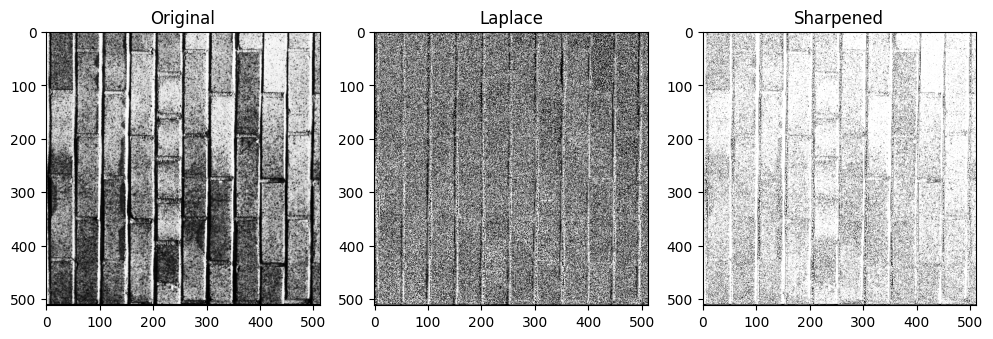

In [ ]:
plt.figure(figsize=(12, 6))
plt.subplot(131), plt.imshow(image, cmap='gray'), plt.title('Original')
plt.subplot(132), plt.imshow(laplace_output, cmap='gray'), plt.title('Laplace')
plt.subplot(133), plt.imshow(sharpened_laplace, cmap='gray'), plt.title('Sharpened')
plt.show()

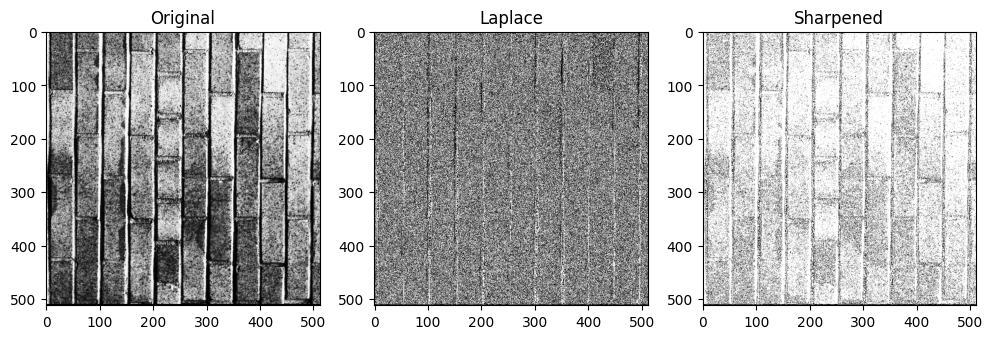

In [ ]:
plt.figure(figsize=(12, 6))
plt.subplot(131), plt.imshow(image, cmap='gray'), plt.title('Original')
plt.subplot(132), plt.imshow(laplace_output2, cmap='gray'), plt.title('Laplace')
plt.subplot(133), plt.imshow(sharpened_laplace2, cmap='gray'), plt.title('Sharpened')
plt.show()

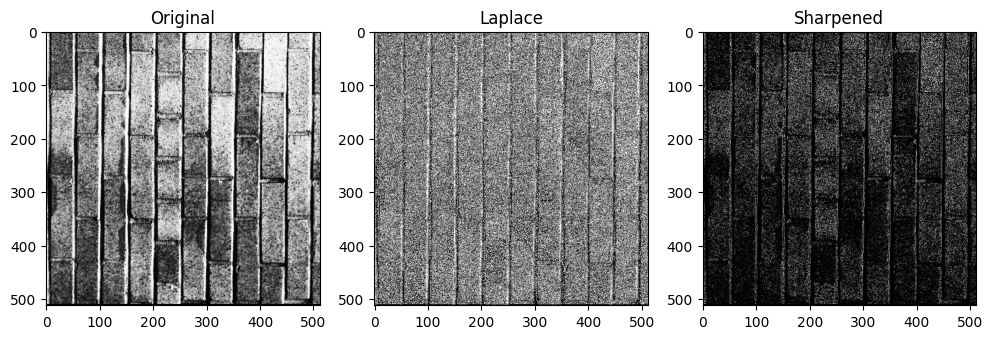

In [ ]:
plt.figure(figsize=(12, 6))
plt.subplot(131), plt.imshow(image, cmap='gray'), plt.title('Original')
plt.subplot(132), plt.imshow(laplace_output3, cmap='gray'), plt.title('Laplace')
plt.subplot(133), plt.imshow(sharpened_laplace3, cmap='gray'), plt.title('Sharpened')
plt.show()

# Image Processing Task: Unsharp Masking and High-Boost Filtering

**Objective:**

The goal of this task is to enhance the sharpness of an image by applying two techniques: unsharp masking and high-boost filtering. Both methods involve blurring the image and then adjusting the sharpness by combining the original and blurred images.

**Description:**

Unsharp Masking: This technique enhances the edges in an image by subtracting a blurred version of the image from the original image. The resulting mask (difference) is then added back to the original image to improve sharpness.

High-Boost Filtering: This method is a variation of unsharp masking where the mask is scaled by a factor k before being added back to the original image. This boosts the sharpness even further.

**Steps:**

Blur the Image:

Create a blur kernel and apply it to the image using convolution.

Apply Unsharp Masking:

Calculate the difference between the original image and the blurred image (mask).

Add this mask back to the original image to sharpen it.

Apply High-Boost Filtering:

Multiply the mask by a scaling factor k and add it to the original image.

Display Results:

Show the original image, blurred image, and the results of both unsharp masking and high-boost filtering.

In [ ]:
def blur(image, kernel_size):
    kernel = np.ones((kernel_size, kernel_size), dtype=float) / (kernel_size**2)
    padded_image = np.pad(image, pad_width=((kernel_size//2, kernel_size//2), (kernel_size//2, kernel_size//2)), mode='reflect')
    blurred = np.zeros_like(image)
    for y in range(image.shape[0]):
        for x in range(image.shape[1]):
            blurred[y, x] = (kernel * padded_image[y:y+kernel_size, x:x+kernel_size]).sum()
    return blurred

blurred_image = blur(image, kernel_size=3)

In [ ]:
mask = image - blurred_image


In [ ]:
unsharp_image = image + mask


In [ ]:
k = 1.5
highboost_image = image + k * mask

In [ ]:
unsharp_image = np.clip(unsharp_image, 0, 255).astype('uint8')
highboost_image = np.clip(highboost_image, 0, 255).astype('uint8')

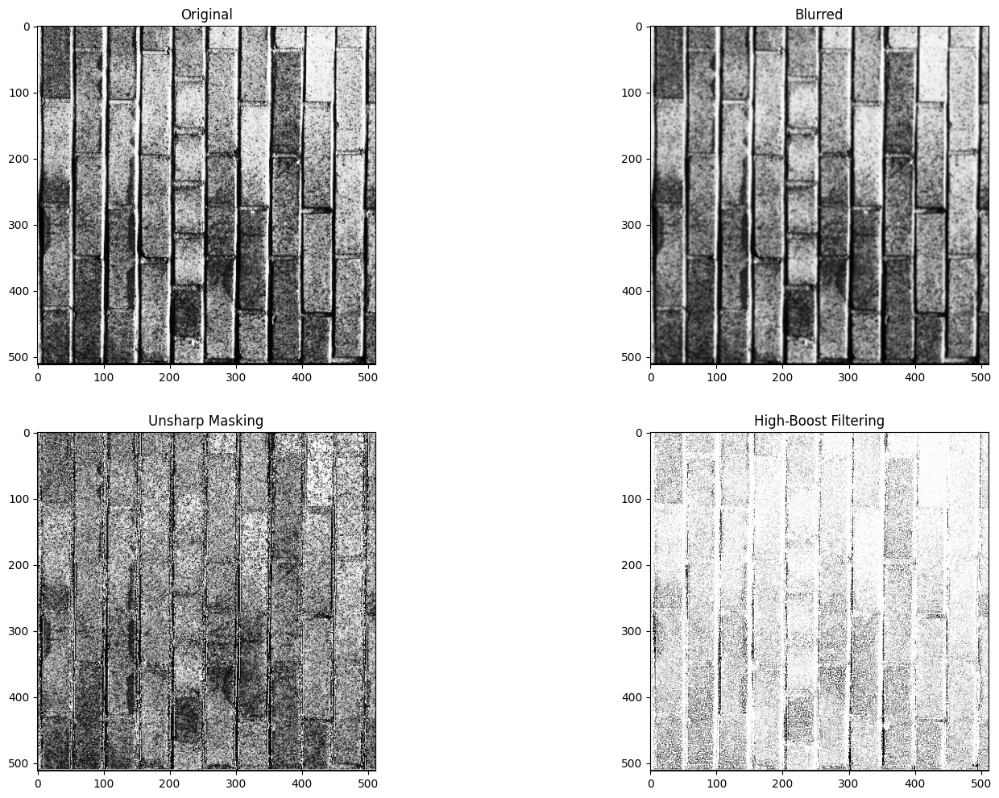

In [ ]:
plt.figure(figsize=(18, 12))
plt.subplot(221), plt.imshow(image, cmap='gray'), plt.title('Original')
plt.subplot(222), plt.imshow(blurred_image, cmap='gray'), plt.title('Blurred')
plt.subplot(223), plt.imshow(unsharp_image, cmap='gray'), plt.title('Unsharp Masking')
plt.subplot(224), plt.imshow(highboost_image, cmap='gray'), plt.title('High-Boost Filtering')
plt.show()

# **Image Processing Task: Fourier Transform and Image Reconstruction**

**Objective:**

This task involves applying the Fourier Transform to images, manipulating their frequency components, and reconstructing images from modified frequency data. The goal is to understand the effects of phase and magnitude on image reconstruction and demonstrate how these components influence the final image.

**Description:**

Fourier Transform Basics:

Fourier Transform (FT): Converts spatial domain images to the frequency domain, representing them as a combination of sinusoidal functions.
Magnitude Spectrum: Shows the amplitude of different frequency components.
Phase Spectrum: Shows the phase shift of these frequency components.

Reconstruction from Magnitude and Phase:

Magnitude-only Reconstruction: Using only the magnitude spectrum while setting phase to zero.
Phase-only Reconstruction: Using only the phase spectrum while setting magnitude to a constant value.

Combining Phase and Magnitude:

Combine magnitude from one image with the phase from another to see how different combinations affect the result.

**Steps and Implementation:**

Load and Preprocess Images:

Convert images to grayscale.
Resize to a uniform size (512x512).

Compute Fourier Transform:

Compute the 2D FFT of the images to get the frequency domain representation.

Reconstruction and Visualization:

Reconstruct images using magnitude and phase data.
Display the original image, magnitude spectrum, phase spectrum, and reconstructed images.

Combine Phase and Magnitude:

Combine magnitude from one image with phase from another and vice versa to demonstrate the effect on the reconstructed image.

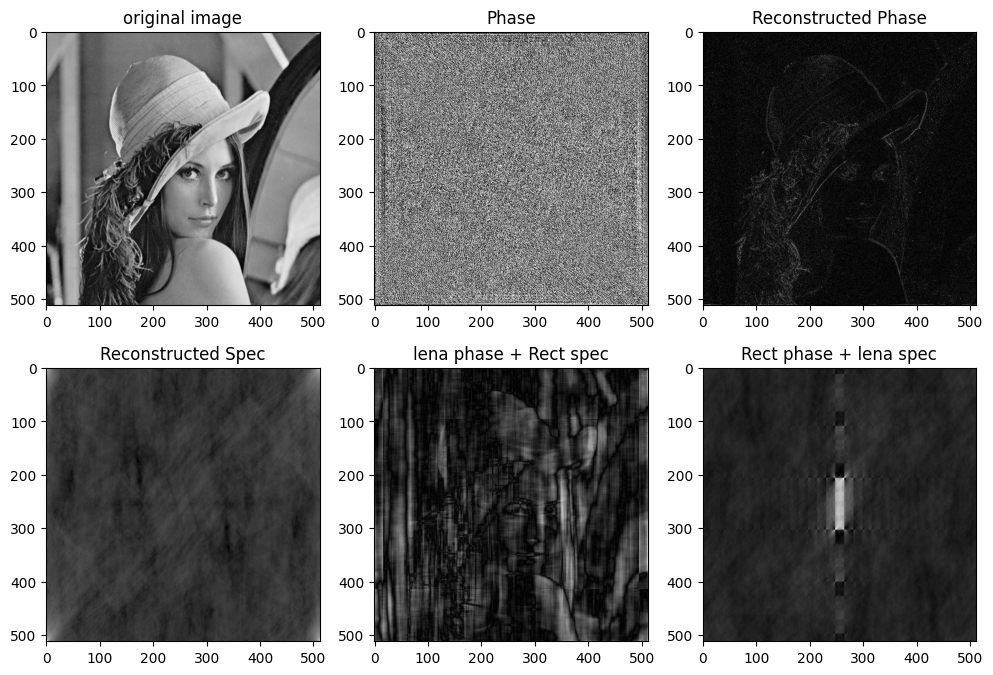

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load and preprocess the image
I = cv2.imread('/content/lena_color_512.tif')
I = cv2.cvtColor(I, cv2.COLOR_BGR2GRAY)
I = cv2.resize(I, (512, 512))

plt.figure(figsize=(12, 8))

# Display original image
plt.subplot(2, 3, 1)
plt.imshow(I, cmap='gray')
plt.title('original image')

# FFT of the image
# FFT2 perform 2D Fourier
F = np.fft.fft2(I)
Fmag = np.abs(F)
Fphase = np.exp(1j * np.angle(F))

# Reconstruction
Remag = np.log(np.abs(np.fft.ifft2(Fmag * np.exp(1j * 0))) + 1)
Rephase = np.fft.ifft2(Fphase)

# Display phase and reconstructed images
plt.subplot(2, 3, 2)
plt.imshow(np.angle(Fphase), cmap='gray')
plt.title('Phase')

plt.subplot(2, 3, 3)
plt.imshow(np.abs(Rephase), cmap='gray')
plt.title('Reconstructed Phase')

plt.subplot(2, 3, 4)
plt.imshow(np.abs(Remag), cmap='gray')
plt.title('Reconstructed Spec')

# Load and preprocess the rectangle image
I2 = cv2.imread('/content/rectangle.tif', cv2.IMREAD_GRAYSCALE)
F2 = np.fft.fft2(I2)
F2mag = np.abs(F2)
F2phase = np.exp(1j * np.angle(F2))

# Combine phase and magnitude from different images
a1 = F2mag * Fphase
a2 = np.abs(np.fft.ifft2(a1))
plt.subplot(2, 3, 5)
plt.imshow(a2, cmap='gray')
plt.title('lena phase + Rect spec')

b1 = Fmag * F2phase
b2 = np.abs(np.fft.ifft2(b1))
plt.subplot(2, 3, 6)
plt.imshow(b2, cmap='gray')
plt.title('Rect phase + lena spec')

plt.show()

In [ ]:
def convolve2(image, kernel):
    # Get the dimensions of the image and the kernel
    image_height, image_width = image.shape
    kernel_height, kernel_width = kernel.shape

    # Create an empty output array
    output = np.zeros_like(image)

    # Pad the image with zeros around the border
    pad_height = kernel_height // 2
    pad_width = kernel_width // 2
    padded_image = np.pad(image, ((pad_height, pad_height), (pad_width, pad_width)), mode='constant')

    # Perform the convolution
    for y in range(pad_height, image_height + pad_height):
        for x in range(pad_width, image_width + pad_width):
            # Ensure the kernel is centered over each pixel
            window = padded_image[y-pad_height:y+pad_height+1, x-pad_width:x+pad_width+1]
            output[y-pad_height, x-pad_width] = np.sum(kernel * window)

    # Making sure the output values are in the 0-255 range
    output = np.clip(output, 0, 255)

    return output

In [ ]:
def blur(image, kernel_size):
    kernel = np.ones((kernel_size, kernel_size), dtype=float) / (kernel_size**2)
    padded_image = np.pad(image, pad_width=((kernel_size//2, kernel_size//2), (kernel_size//2, kernel_size//2)), mode='reflect')
    blurred = np.zeros_like(image)
    for y in range(image.shape[0]):
        for x in range(image.shape[1]):
            blurred[y, x] = (kernel * padded_image[y:y+kernel_size, x:x+kernel_size]).sum()
    return blurred

In [ ]:
def salt_and_pepper(image, salt_prob, pepper_prob):
    noisy_image = np.copy(image)

    # Salt noise
    salt_pixels = np.random.rand(*image.shape[:2]) < salt_prob
    noisy_image[salt_pixels] = 255

    # Pepper noise
    pepper_pixels = np.random.rand(*image.shape[:2]) < pepper_prob
    noisy_image[pepper_pixels] = 0

    return noisy_image

In [ ]:
def median_filter(image, kernel_size):
    height, width = image.shape
    filtered_image = np.zeros_like(image)

    for i in range(height):
        for j in range(width):
            # Extract the neighborhood using the kernel
            neighborhood = image[max(0, i - kernel_size // 2):min(height, i + kernel_size // 2 + 1),
                                 max(0, j - kernel_size // 2):min(width, j + kernel_size // 2 + 1)]

            # Apply median filter to the neighborhood
            filtered_image[i, j] = np.median(neighborhood)

    return filtered_image

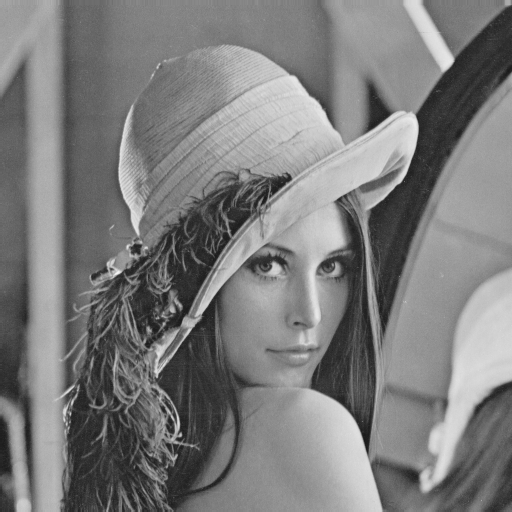

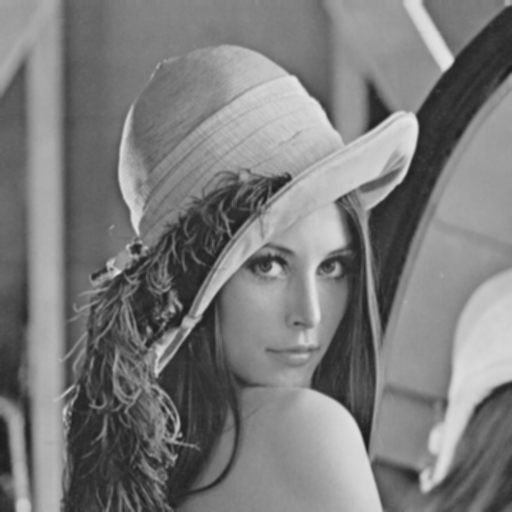

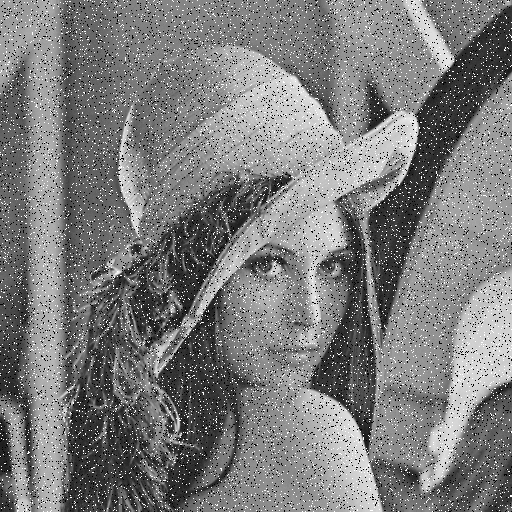

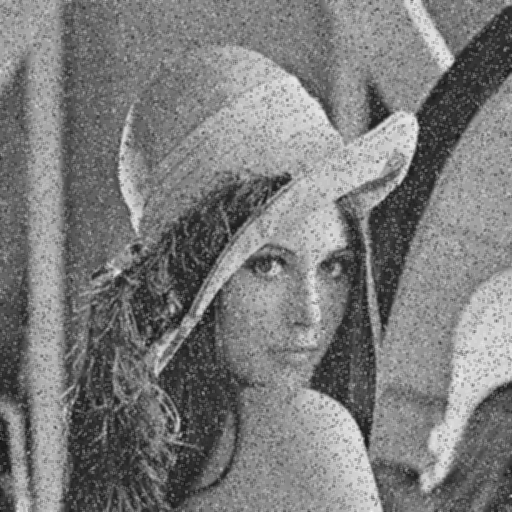

In [ ]:
import cv2
import numpy as np
image_path = '/content/lena_gray_512.tif'  # Replace with the path to your image
original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

salt_prob = 0.05  # Adjust as needed
pepper_prob = 0.05  # Adjust as needed

salt_pepper_image = salt_and_pepper(original_image, salt_prob, pepper_prob)
blured_image = blur(original_image,3)
peper_blured_image = blur(salt_pepper_image,3)

# Display the original and noisy images
cv2_imshow(original_image)
cv2_imshow(blured_image)
cv2_imshow(salt_pepper_image)
cv2_imshow(peper_blured_image)



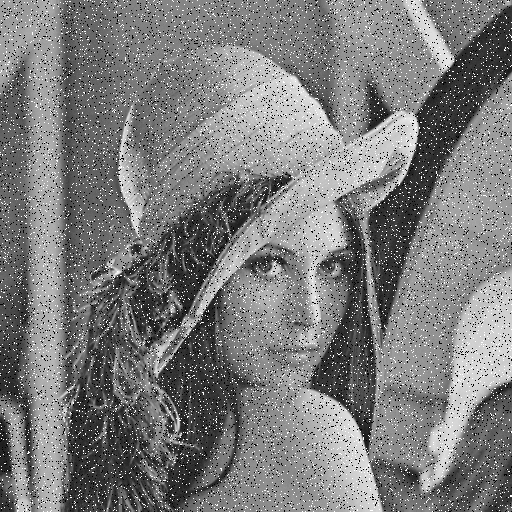

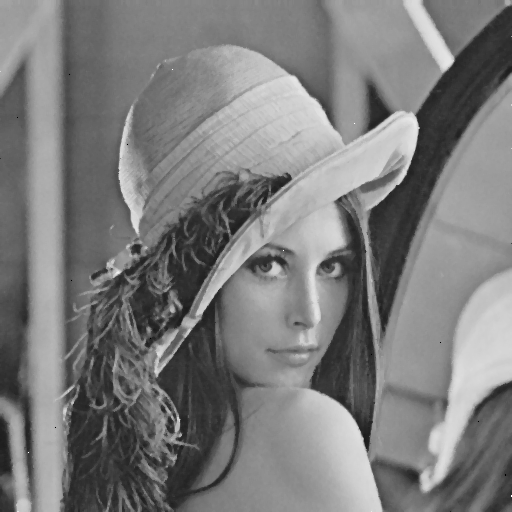

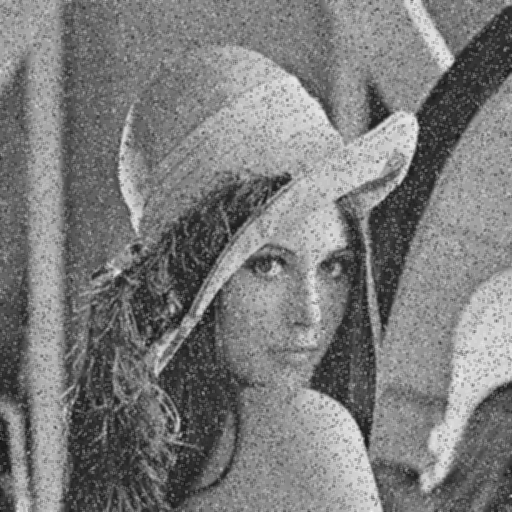

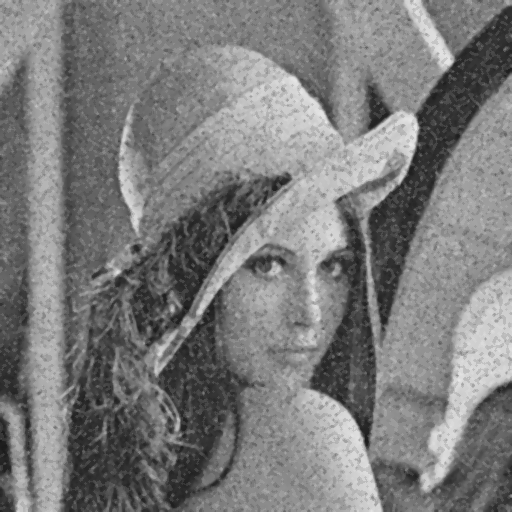

In [ ]:
image_path = '/content/lena_gray_512.tif'  # Replace with the path to your image
original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

kernel_size = 3  # Adjust as needed

filtered_image = median_filter(salt_pepper_image, kernel_size)
filtered_image2 = median_filter(peper_blured_image, kernel_size)

# Display the original and filtered images
cv2_imshow(salt_pepper_image)
cv2_imshow(filtered_image)
cv2_imshow(peper_blured_image)
cv2_imshow(filtered_image2)

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [ ]:
laplace_output = convolve2(salt_pepper_image, laplacian_kernel2)
c = 0.3
sharpened_laplace = np.clip(salt_pepper_image + c * laplace_output, 0, 255).astype(np.uint8)

laplace_output_double = convolve2(sharpened_laplace, laplacian_kernel)
c = 0.3
sharpened_laplace_double = np.clip(salt_pepper_image + c * laplace_output_double, 0, 255).astype(np.uint8)

laplace_output_p_b = convolve2(peper_blured_image, laplacian_kernel2)
c = 0.3
sharpened_laplace2 = np.clip(peper_blured_image + c * laplace_output_p_b, 0, 255).astype(np.uint8)

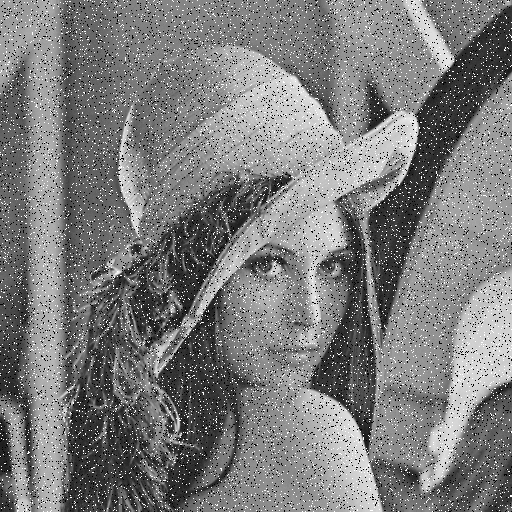

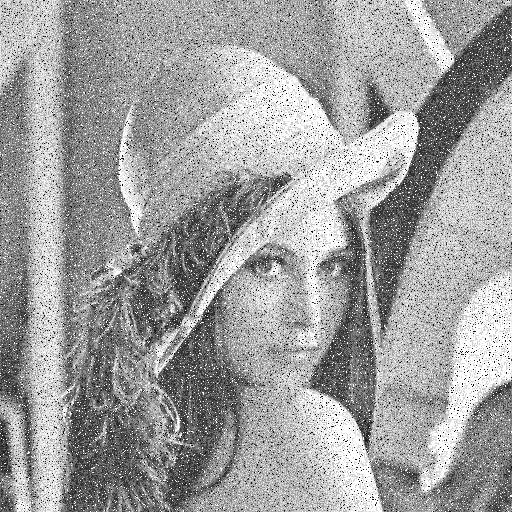

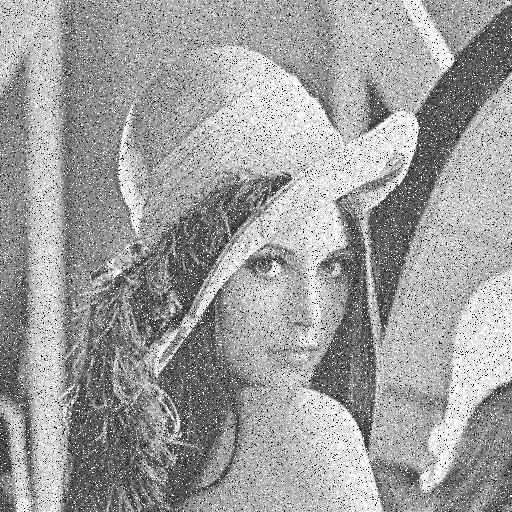

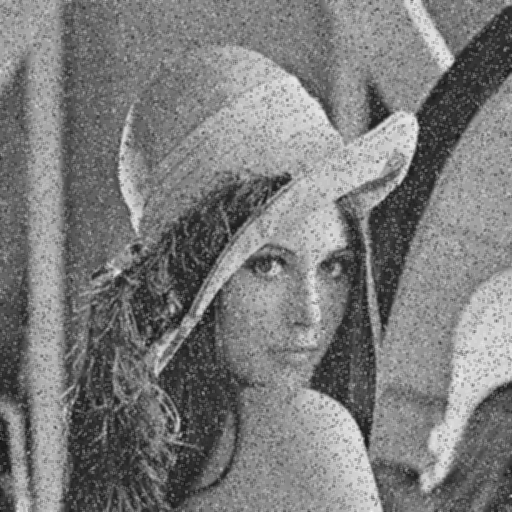

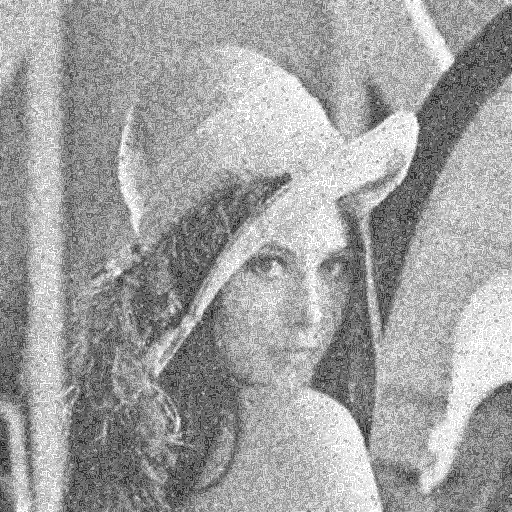

In [ ]:
cv2_imshow(salt_pepper_image)
cv2_imshow(sharpened_laplace)
cv2_imshow(sharpened_laplace_double)

cv2_imshow(peper_blured_image)
cv2_imshow(sharpened_laplace2)

#

In [ ]:
sobel_x = convolve2(salt_pepper_image, sobel_x_kernel)
sobel_y = convolve2(salt_pepper_image, sobel_y_kernel)
sobel_x2 = convolve2(peper_blured_image, sobel_x_kernel)
sobel_y2 = convolve2(peper_blured_image, sobel_y_kernel)

In [ ]:
gradient_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
gradient_magnitude = (gradient_magnitude / np.max(gradient_magnitude) * 255).astype(np.uint8)
alpha = 0.3
sharpened = np.clip(salt_pepper_image + alpha * gradient_magnitude, 0, 255)

gradient_magnitude2 = np.sqrt(sobel_x2**2 + sobel_y2**2)
gradient_magnitude2 = (gradient_magnitude2 / np.max(gradient_magnitude2) * 255).astype(np.uint8)
alpha = 0.3
sharpened2 = np.clip(peper_blured_image + alpha * gradient_magnitude2, 0, 255)

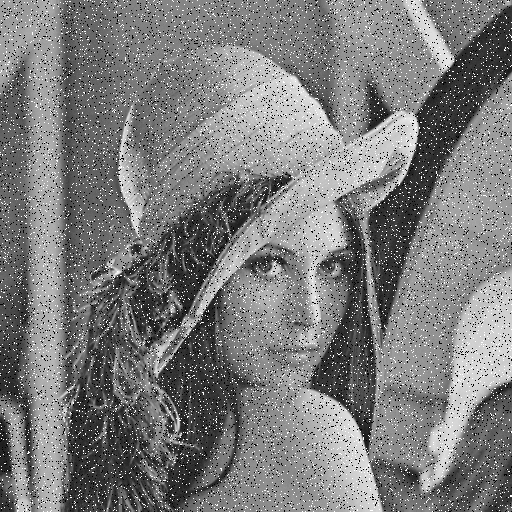

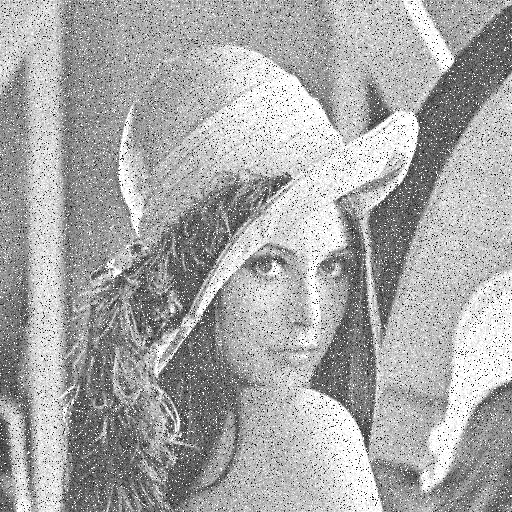

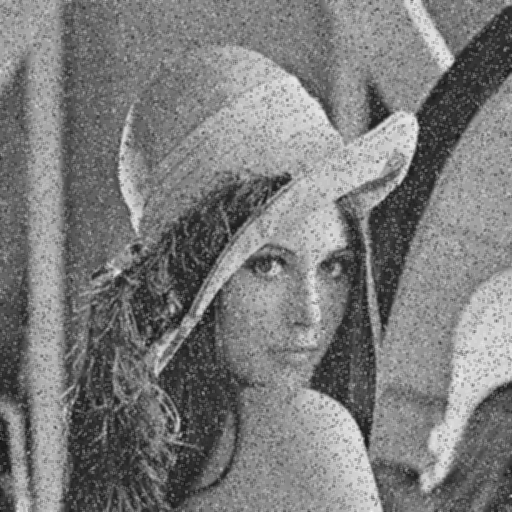

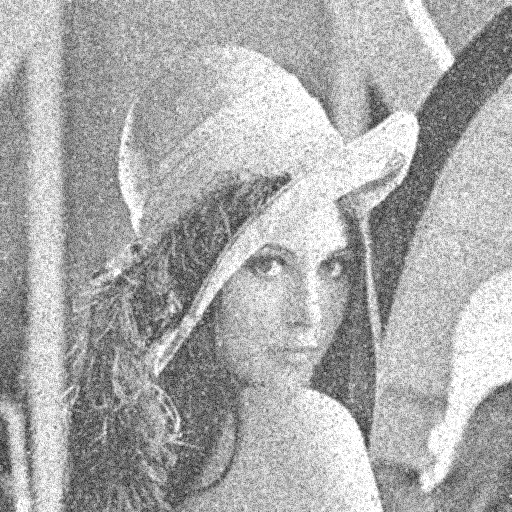

In [ ]:
cv2_imshow(salt_pepper_image)
cv2_imshow(sharpened)
cv2_imshow(peper_blured_image)
cv2_imshow(sharpened2)

In [ ]:
def add_gaussian_noise(image, mean=0, std=25):
    row, col = image.shape
    gauss = np.random.normal(mean, std, (row, col))
    noisy = np.clip(image + gauss, 0, 255)
    return noisy.astype(np.uint8)

# **Adaptive Filtering with Gaussian Noise Reduction**

**Objective:**

The goal is to apply an adaptive filter to an image to reduce Gaussian noise. The adaptive filter adjusts itself based on local image characteristics, specifically the local variance of pixel values.

**Key Concepts:**

Adaptive Filtering: A technique where the filter adjusts its parameters based on the local statistical properties of the image, such as local mean and variance.


Gaussian Filter: A filter used to smooth the image by averaging pixel values within a local window, weighted by a Gaussian function.


Noise Variance: The variance of the noise, assumed to be constant in this example.


**Description:**

Padding: To handle borders of the image, the image is padded using reflection mode.

**Local Statistics Calculation:**

Local Mean: Average pixel value in the local window.

Local Variance: Variability of pixel values in the local window.

Gaussian Filter: Applied to the local window to smooth it.

Adaptive Filtering Formula:

The filtered value is adjusted based on the local mean and variance, considering the noise variance.

Visualization: Display the original image, noisy image, and the filtered image.

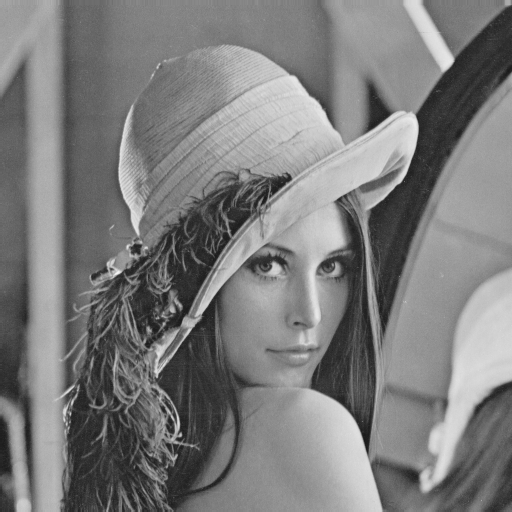

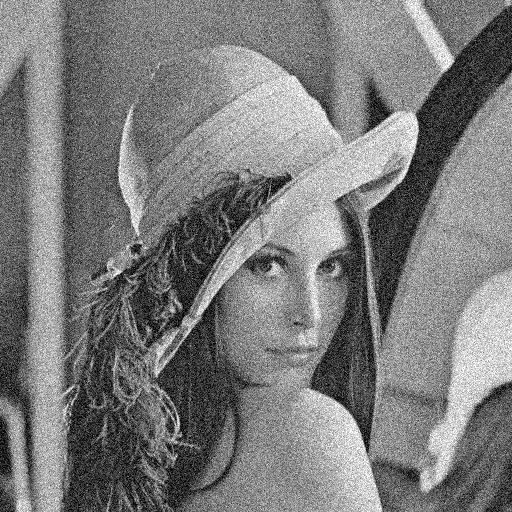

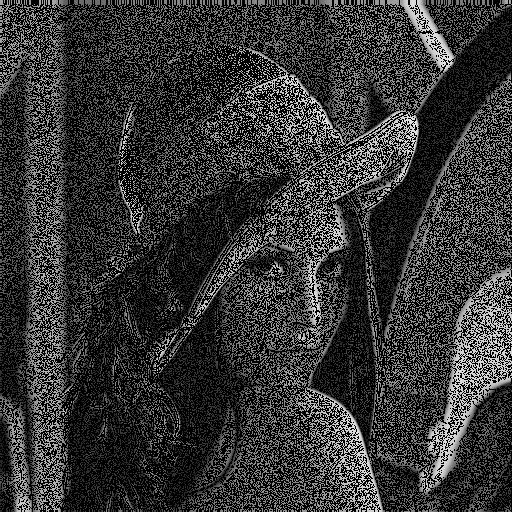

In [ ]:
import cv2
import numpy as np

def adaptive_median_filter(img, window_size):
    height, width = img.shape
    result = np.zeros_like(img)

    for i in range(height):
        for j in range(width):

                median_value = np.median(window)
                pixel_value = img[i, j]

                if median_value - pixel_value < 0.5 and pixel_value - median_value < 0.5:
                    result[i, j] = pixel_value
                    break
                else:
                    window_size += 2

    return result

# Example usage:
# Load an image
image = cv2.imread('/content/lena_gray_512.tif', cv2.IMREAD_GRAYSCALE)

image_float = image.astype(float)

noisy_image = add_gaussian_noise(image_float)

filtered_image = adaptive_median_filter(noisy_image, max_window_size=7)

noisy_image_uint8 = noisy_image.astype(np.uint8)
filtered_image_uint8 = filtered_image.astype(np.uint8)


# Convert image to float for better precision
image_float = image.astype(float)

# Apply adaptive median filter
filtered_image = adaptive_median_filter(image_float, max_window_size=7)

# Convert the result back to uint8 for display
filtered_image_uint8 = filtered_image.astype(np.uint8)

# Display the original and filtered images
cv2_imshow(image)
cv2_imshow(noisy_image_uint8)
cv2_imshow(filtered_image_uint8)

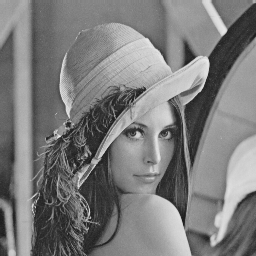

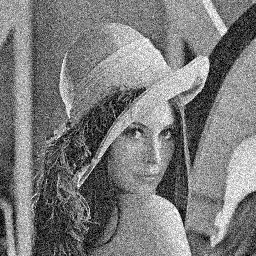

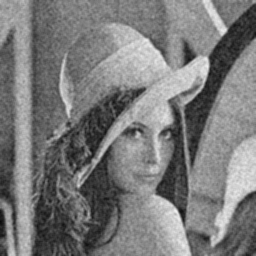

In [ ]:
import cv2
import numpy as np
from scipy.ndimage import gaussian_filter


window_size = 3
half_window = window_size // 2
def adaptive_filter(image, window_size):
    # Pad the image to handle the borders
    padded_image = np.pad(image, half_window, mode='reflect')

    # Placeholder for the filtered image
    filtered_image = np.zeros_like(image)

    # Iterate over each pixel in the image
    for i in range(half_window, padded_image.shape[0] - half_window):
        for j in range(half_window, padded_image.shape[1] - half_window):
            # Extract the local window
            window = padded_image[i-half_window:i+half_window+1, j-half_window:j+half_window+1]

            # Calculate local mean
            local_mean = np.mean(window)

            # Apply Gaussian filter to the local window
            local_gaussian = gaussian_filter(window, sigma=1)

            # Calculate local variance
            local_variance = np.var(window)

            # Calculate noise variance (assuming noise variance is 0.01 for demonstration purposes)
            noise_variance = 0.01

            # Compute the adaptive filter value for the current pixel
            filtered_image[i-half_window, j-half_window] = local_gaussian[half_window, half_window] - \
                                                           ((noise_variance ** 2) / local_variance) * \
                                                           (local_gaussian[half_window, half_window] - local_mean)
    return filtered_image

# Example usage:
# Load an image
image = cv2.imread('/content/lena_gray_256.tif', cv2.IMREAD_GRAYSCALE)

image_float = image.astype(float)

noisy_image = add_gaussian_noise(image_float)

filtered_image = adaptive_filter(noisy_image, 7)
noisy_image_uint8 = noisy_image.astype(np.uint8)
filtered_image_uint8 = filtered_image.astype(np.uint8)


# Convert image to float for better precision
image_float = image.astype(float)

# Display the original and filtered images
cv2_imshow(image)
cv2_imshow(noisy_image_uint8)
cv2_imshow(filtered_image_uint8)

In [ ]:
from PIL import Image
import numpy as np
from scipy.fft import fft2, ifft2, fftshift

def linear_motion_blur(image_path, a, b, T):
    # Load the image
    image = Image.open(image_path)
    image = image.convert('L')  # Convert to grayscale
    img_array = np.array(image)

    # Frequency coordinates
    H, W = img_array.shape
    u = np.fft.fftfreq(W)
    v = np.fft.fftfreq(H)
    U, V = np.meshgrid(u, v)

    # Construct the motion blur filter in the frequency domain
    # Adding a small number to the denominator to avoid division by zero
    H_uv = np.exp(-1j * 2 * np.pi * ((U * a + V * b) * T)) / (np.pi * (U * a + V * b) + 1e-10)
    H_uv = fftshift(H_uv)  # Center the zero frequencies

    # Apply the motion blur filter to the image
    G_uv = fft2(img_array) * H_uv
    blurred_img_array = np.abs(ifft2(G_uv))

    # Convert back to image
    blurred_image = Image.fromarray(blurred_img_array.astype(np.uint8))

    # Save the blurred image
    blurred_image_path = image_path.replace('.jpeg', '_blurred.jpeg')
    blurred_image.save(blurred_image_path)

    return blurred_image_path

# Parameters for the blur
a = 0.1  # Change in x-direction
b = 0.1  # Change in y-direction
T = 1.0  # Total time of exposure

# Apply the blur to the uploaded image
blurred_image_path = linear_motion_blur('/content/images.jpeg', a, b, T)
blurred_image_path

'/content/images_blurred.jpeg'

# **Image Restoration Techniques**
 **Inverse Filtering**

Inverse Filtering is a technique used to reverse the effects of linear degradation (e.g., blur) when the degradation kernel (or blur kernel) is known.

**Wiener Filtering**

Wiener Filtering is a more sophisticated technique that takes into account both the degradation kernel and the noise. It aims to minimize the mean square error between the restored image and the original image.


In [ ]:
import cv2
import numpy as np
from scipy.signal import convolve2d
import matplotlib.pyplot as plt

def destroy_image_uniform_linear_motion(image, length, angle):
    kernel = cv2.getRotationMatrix2D((length/2, length/2), angle, 1)
    motion_blur_kernel = np.diag(np.ones(length))
    motion_blur_kernel = cv2.warpAffine(motion_blur_kernel, kernel, (length, length))
    motion_blur_kernel /= length
    return convolve2d(image, motion_blur_kernel, mode='same', boundary='wrap')

def add_salt_and_pepper_noise(image, noise_level):
    noisy_image = image.copy()
    num_salt = np.ceil(noise_level * image.size * 0.5)
    salt_coords = [np.random.randint(0, i - 1, int(num_salt)) for i in image.shape]
    noisy_image[salt_coords[0], salt_coords[1]] = 1

    num_pepper = np.ceil(noise_level * image.size * 0.5)
    pepper_coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in image.shape]
    noisy_image[pepper_coords[0], pepper_coords[1]] = 0
    return noisy_image

def inverse_filtering(image, kernel):
    fft_image = np.fft.fft2(image)
    fft_kernel = np.fft.fft2(kernel, s=image.shape)
    inverse_filter = np.divide(fft_image, fft_kernel, out=np.zeros_like(fft_image), where=fft_kernel != 0)
    restored_image = np.fft.ifft2(inverse_filter).real
    return np.clip(restored_image, 0, 255).astype(np.uint8)

def wiener_filter(image, kernel, noise_variance):
    fft_image = np.fft.fft2(image)
    fft_kernel = np.fft.fft2(kernel, s=image.shape)
    wiener_filter = np.conj(fft_kernel) / (np.abs(fft_kernel)**2 + noise_variance)
    restored_image = np.fft.ifft2(fft_image * wiener_filter).real
    return np.clip(restored_image, 0, 255).astype(np.uint8)


(<Axes: title={'center': 'restored_wiener'}>,
 Text(0.5, 1.0, 'restored_wiener'))

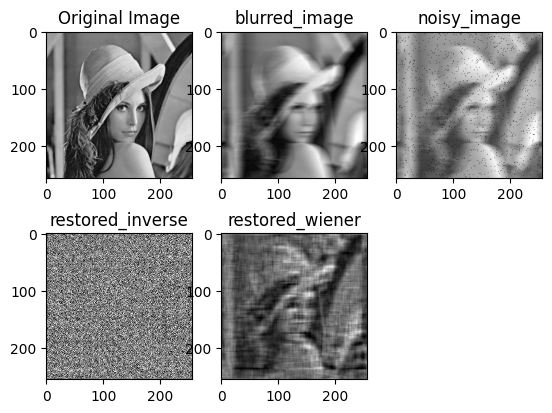

In [ ]:

# Load an image
image_path = '/content/lena_color_256.tif'
original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Parameters for linear motion blur
motion_length = 20
motion_angle = 45

# Parameters for salt and pepper noise
noise_level = 0.02

# Linear motion blur
blurred_image = destroy_image_uniform_linear_motion(original_image, motion_length, motion_angle)

# Salt and pepper noise
noisy_image = add_salt_and_pepper_noise(blurred_image, noise_level)

# Inverse filtering (assuming a known motion blur kernel)
motion_blur_kernel = np.ones((motion_length, motion_length)) / motion_length**2
restored_inverse = inverse_filtering(noisy_image, motion_blur_kernel)

# Wiener filtering
noise_variance = noise_level
restored_wiener = wiener_filter(noisy_image, motion_blur_kernel, noise_variance)
plt.subplot(231), plt.imshow(original_image, cmap='gray'), plt.title('Original Image')
plt.subplot(232), plt.imshow(blurred_image, cmap='gray'), plt.title('blurred_image')
plt.subplot(233), plt.imshow(noisy_image, cmap='gray'), plt.title('noisy_image')
plt.subplot(234), plt.imshow(restored_inverse, cmap='gray'), plt.title('restored_inverse')
plt.subplot(235), plt.imshow(restored_wiener, cmap='gray'), plt.title('restored_wiener')

(<Axes: title={'center': 'restored_wiener'}>,
 Text(0.5, 1.0, 'restored_wiener'))

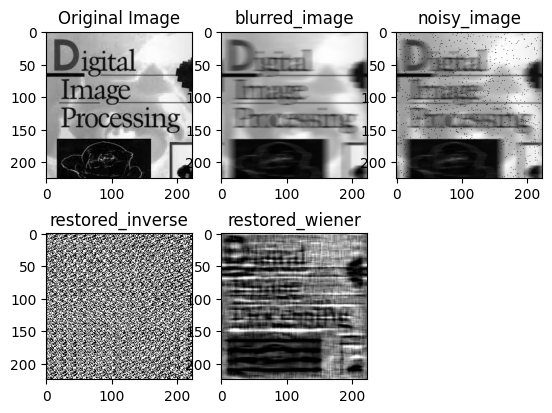

In [ ]:
image_path = '/content/images.jpeg'
original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Parameters for linear motion blur
motion_length = 15
motion_angle = 45

# Parameters for salt and pepper noise
noise_level = 0.02

# Linear motion blur
blurred_image = destroy_image_uniform_linear_motion(original_image, motion_length, motion_angle)

# Salt and pepper noise
noisy_image = add_salt_and_pepper_noise(blurred_image, noise_level)

# Inverse filtering (assuming a known motion blur kernel)
motion_blur_kernel = np.ones((motion_length, motion_length)) / motion_length**2
restored_inverse = inverse_filtering(noisy_image, motion_blur_kernel)

# Wiener filtering
noise_variance = noise_level
restored_wiener = wiener_filter(noisy_image, motion_blur_kernel, noise_variance)




plt.subplot(231), plt.imshow(original_image, cmap='gray'), plt.title('Original Image')
plt.subplot(232), plt.imshow(blurred_image, cmap='gray'), plt.title('blurred_image')
plt.subplot(233), plt.imshow(noisy_image, cmap='gray'), plt.title('noisy_image')
plt.subplot(234), plt.imshow(restored_inverse, cmap='gray'), plt.title('restored_inverse')
plt.subplot(235), plt.imshow(restored_wiener, cmap='gray'), plt.title('restored_wiener')

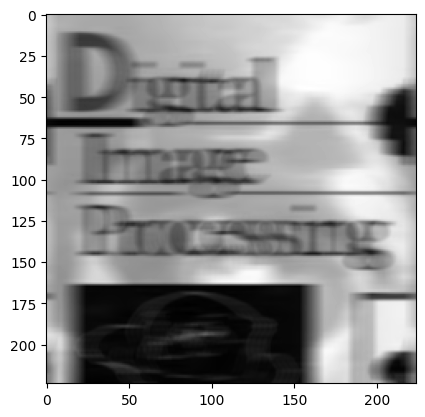

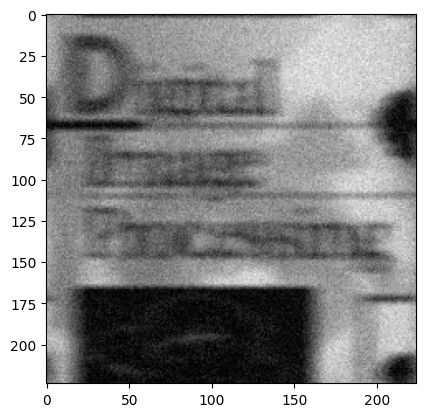

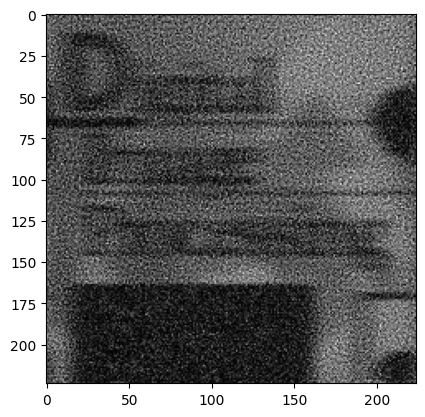

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

N = 224
n = 0.2

f = blurred_image

# Display the original image
plt.figure(1)
plt.imshow(f, cmap='gray')
plt.show()

# Define the averaging filter
b = np.ones((4, 4)) / 4**2

# Compute 2D FFT of the image and the filter
F = np.fft.fft2(f)
B = np.fft.fft2(b, s=(N, N))

# Apply the filter in the frequency domain
G = F * B

# Add noise to the image
g = np.fft.ifft2(G) + 10 * np.random.randn(N, N)

# Compute the FFT of the noisy image
G = np.fft.fft2(g)

# Display the magnitude of the FFT of the noisy image
plt.figure(2)
plt.imshow(np.abs(np.fft.ifft2(G)), cmap='gray')
plt.show()

# Set small values in the filter to a threshold 'n'
BF = np.abs(B) < n
B[BF] = n

# Compute the inverse filter
H = np.ones((N, N)) / B

# Apply the inverse filter in the frequency domain
I = G * H

# Compute the inverse FFT to obtain the final image
im = np.abs(np.fft.ifft2(I))

# Display the final image
plt.figure(3)
plt.imshow(im, cmap='gray')
plt.show()

In [ ]:
def calculate_mse(original, restored):
    return np.mean((original - restored)**2)

In [ ]:
def degrade_image(img, a=0.1, b=0.1, T=1):
    M, N = img.shape[:2]

    u = np.arange(-N/2, N/2)
    v = np.arange(-M/2, M/2)
    U, V = np.meshgrid(u, v)
    degradation_function = np.sinc((a * U + b * V) / 2) * np.exp(-1j * np.pi * (a * U + b * V))
    degradation_function[np.isclose(degradation_function, 0)] = 1e-10

    # FFT of the image
    img_fft = fftshift(fft2(img))

    # Apply degradation
    degraded_fft = img_fft * degradation_function
    degraded_img = np.real(ifft2(ifftshift(degraded_fft)))

    return degraded_img

In [ ]:
def inverse_filter(img, a=0.1, b=0.1, T=1, gamma=1):
    M, N = img.shape

    u = np.arange(-N/2, N/2)
    v = np.arange(-M/2, M/2)
    U, V = np.meshgrid(u, v)
    degradation_function = np.sinc((a * U + b * V) / 2) * np.exp(-1j * np.pi * (a * U + b * V))

    # Handle singular case (zero case)
    sHf = degradation_function * (np.abs(degradation_function) > 0) + 1/gamma * (np.abs(degradation_function) == 0)
    iHf = 1 / sHf
    iHf = iHf * (np.abs(degradation_function) * gamma > 1) + gamma * np.abs(sHf) * iHf * (np.abs(sHf) * gamma <= 1)

    # Apply inverse filter
    img_fft = fftshift(fft2(img))
    restored_fft = img_fft * iHf
    restored_img = np.real(ifft2(ifftshift(restored_fft)))

    return restored_img

In [ ]:
def wiener_filter(img, degraded_img, a=0.1, b=0.1, T=1, K=0.0025):
    """
    Apply Wiener filter to restore the image.
    :param img: Original image
    :param degraded_img: Degraded image
    :param a: Horizontal motion blur parameter
    :param b: Vertical motion blur parameter
    :param T: Time of exposure
    :param K: Noise-to-signal ratio
    :return: Restored image
    """
    # Image dimensions
    M, N = img.shape

    # Generate degradation function in frequency domain
    u = np.arange(-N/2, N/2)
    v = np.arange(-M/2, M/2)
    U, V = np.meshgrid(u, v)
    degradation_function = np.sinc((a * U + b * V) / 2) * np.exp(-1j * np.pi * (a * U + b * V))

    # FFT of the degraded image
    degraded_fft = fftshift(fft2(degraded_img))

    # Wiener filter
    H_conj = np.conj(degradation_function)
    denominator = np.abs(degradation_function)**2 + K
    wiener_filter = H_conj / denominator

    # Apply Wiener filter
    restored_fft = degraded_fft * wiener_filter
    restored_img = np.real(ifft2(ifftshift(restored_fft)))

    return restored_img

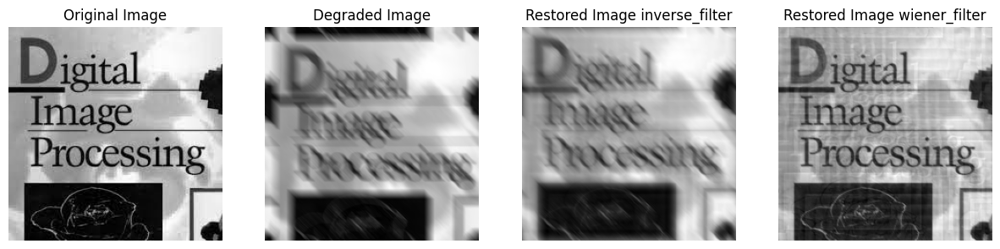

mse for degraded_image is
5703.593395703819
mse for invers is
1139.9565449290226
mse for weiner is
228.91040151915053


In [ ]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from scipy.fftpack import fft2, ifft2, fftshift, ifftshift
from scipy.signal import convolve2d

image_path = '/content/images.jpeg'
original_image = Image.open(image_path)
image_array = np.array(original_image)

fig, axs = plt.subplots(1, 4, figsize=(15, 5))
axs[0].imshow(image_array, cmap='gray')
axs[0].set_title('Original Image')
axs[0].axis('off')

# Degrade the image
degraded_image = degrade_image(image_array[:,:,1])
mse_value = calculate_mse(image_array[:,:,1], degraded_image)
axs[1].imshow(degraded_image, cmap='gray')
axs[1].set_title('Degraded Image')
axs[1].axis('off')
# Function to apply Wiener filter

restored_image = wiener_filter(image_array[:,:,1], degraded_image)
mse_value_wiener = calculate_mse(image_array[:,:,1], restored_image)
restored_image_inverse_filter = inverse_filter(degraded_image)
axs[2].imshow(restored_image_inverse_filter, cmap='gray')
axs[2].set_title('Restored Image inverse_filter')
axs[2].axis('off')
# Apply inverse filter to degraded image

mse_value_inverse_filter = calculate_mse(image_array[:,:,1], restored_image_inverse_filter)
axs[3].imshow(restored_image, cmap='gray')
axs[3].set_title('Restored Image wiener_filter')
axs[3].axis('off')

plt.show()
print("mse for degraded_image is")
print(mse_value)
print("mse for invers is")
print(mse_value_inverse_filter)
print("mse for weiner is")
print(mse_value_wiener)

In [ ]:
print()
print()

2.456927871230775

# **Radon Transform**

Definition:

The Radon transform is a mathematical operation that converts an image into a set of projections. It represents an image as a collection of its projections (or line integrals) taken at various angles. Essentially, it is a way of projecting a 2D image onto a line.
# Back Projection

Definition:


Back projection is a process used to reconstruct an image from its projections. It is the inverse operation of the Radon transform. In back projection, the projections are used to reconstruct the original image by "projecting" each projection back onto the image space.



In [ ]:
def calculate_snr(original, restored):
    signal_power = np.sum(original**2)
    noise_power = np.sum((original - restored)**2)
    snr = 10*np.log(signal_power / noise_power)
    return snr , signal_power ,noise_power

snr_degraded,x,y = calculate_snr(image_array[:,:,1], degraded_image)

snr_wiener,x,y = calculate_snr(image_array[:,:,1], restored_image)

snr_inverse_filter,x,y = calculate_snr(image_array[:,:,1], restored_image_inverse_filter)

print(f'SNR (degraded): {snr_degraded:.2f} ')
print(f'SNR (Inverse Filter): {snr_inverse_filter:.2f} ')
print(f'SNR (Wiener Filter): {snr_wiener:.2f} ')


SNR (degraded): -17.39 
SNR (Inverse Filter): -10.40 
SNR (Wiener Filter): -3.42 


In [ ]:
def back_projection2(sinogram, thetas):
    size_ = sinogram.shape[0]
    recon_img = np.zeros((size_, size_))

    for i, theta in enumerate(thetas):
        # Step 1: Compute the 1-D Fourier transform of each projection
        projection_fft = fft(sinogram[:, i])

        # Step 2: Multiply by the filter function (e.g., Hamming window)
        filter_function = np.abs(projection_fft) * hamming(size_)
        filtered_projection_fft = projection_fft * filter_function

        # Step 3: Obtain the inverse 1-D Fourier transform of the filtered transform
        filtered_projection = ifft(filtered_projection_fft).real

        # Step 4: Integrate (sum) the 1-D inverse transforms
        recon_img += filtered_projection

    return np.flipud(recon_img)

In [ ]:
def back_projection3(sinogram,thetas):
  size_=sinogram.shape[0]
  recon_img=np.zeros((size_,size_))

  for i,theta in enumerate(thetas):
    tmp1=sinogram[:,i]

    tmp=np.repeat(np.expand_dims(tmp1,1),size_,axis=1).T
    tmp=Image.fromarray(tmp)

    tmp=tmp.rotate(theta,expand=0)

    recon_img+=tmp

  return np.flipud(recon_img)

In [ ]:
from scipy.signal import hamming


<ipython-input-13-443822ca39f4>:10: DeprecationWarning: Importing hamming from 'scipy.signal' is deprecated and will raise an error in SciPy 1.13.0. Please use 'scipy.signal.windows.hamming' or the convenience function 'scipy.signal.get_window' instead.
  filter_function = np.abs(projection_fft) * hamming(size_)


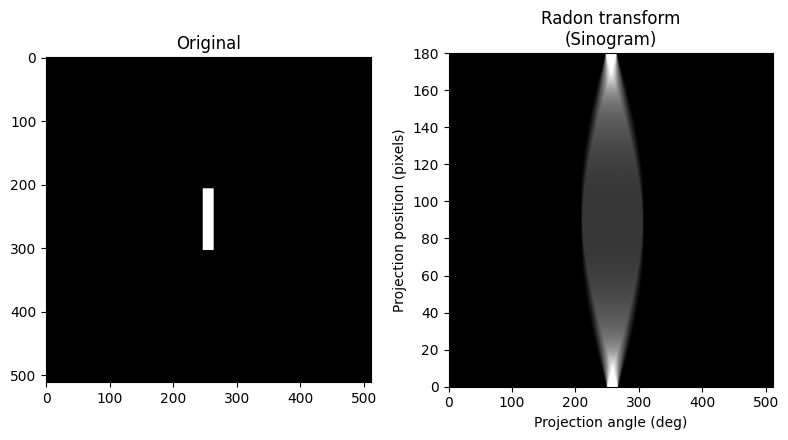

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import radon, rescale
from skimage.color import rgb2gray
from PIL import Image

# Load and preprocess the image
image = imread('/content/rectangle.tif')  # Replace with your image path

# Perform the Radon transform
theta = np.linspace(0., 180., max(image.shape), endpoint=False)
sinogram = radon(image, theta=theta, circle=True)
rec = back_projection2(sinogram,theta)
rec2 = back_projection3(sinogram,theta)

# Display the original image and the result
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4.5))

ax1.set_title("Original")
ax1.imshow(image, cmap=plt.cm.Greys_r)

ax2.set_title("Radon transform\n(Sinogram)")
ax2.set_xlabel("Projection angle (deg)")
ax2.set_ylabel("Projection position (pixels)")
ax2.imshow(sinogram.T, cmap=plt.cm.Greys_r, extent=(0, sinogram.shape[0], 0, 180), aspect='auto')

plt.tight_layout()
plt.show()

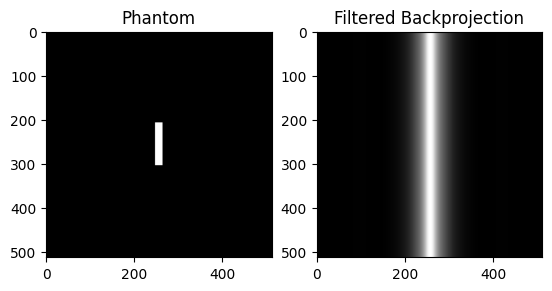

In [ ]:
fig=plt.figure()
fig.add_subplot(121)
plt.title("Phantom")
plt.imshow(image,cmap=plt.get_cmap("gray"))
fig.add_subplot(122)
plt.title("Filtered Backprojection")
plt.imshow(rec,cmap=plt.get_cmap("gray"))
plt.show()

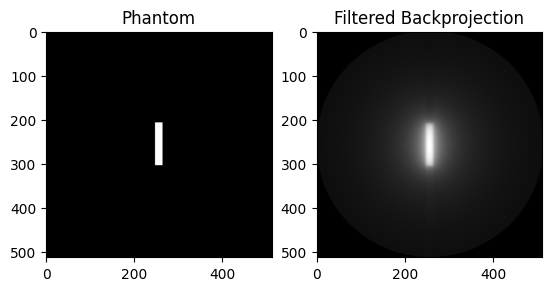

In [ ]:
fig=plt.figure()
fig.add_subplot(121)
plt.title("Phantom")
plt.imshow(image,cmap=plt.get_cmap("gray"))
fig.add_subplot(122)
plt.title("Filtered Backprojection")
plt.imshow(rec2,cmap=plt.get_cmap("gray"))
plt.show()